<div style="border-top: 3px solid #0a6d91; padding: 15px; display: flex; align-items: center; justify-content: space-between;">

  <!-- Left text -->
  <div style="flex: 1; padding-right: 20px;">
    <h2 style= display: inline-block; padding: 5px 10px; border-radius: 3px;">
      Advanced statistics <br>for physics analysis - Project
    </h2>
    <h3>Bayesian Analysis of ARPAV time series <br> on temperatures and
precipitations</h3>
  </div>

  <!-- Right images -->
  <div style="flex: 0 0 auto; display: flex; align-items: center; gap: 20px;">
    <img src="https://th.bing.com/th/id/R.f158dd00f7e0e326ff081cf1acb39901?rik=tfJW%2frH3keCJ%2fg&riu=http%3a%2f%2fboostlab.dfa.unipd.it%2fimg%2flogo_pod.png&ehk=Th6GDiUuQTgD%2faBhIK7JUi15%2bG%2f35LzMJV9PFEPd9rg%3d&risl=&pid=ImgRaw&r=0" alt="PoD" width="250"/>
    <img src="https://www.unidformazione.com/wp-content/uploads/2018/04/unipd-universita-di-padova-1024x463.png" alt="UNIPD" width = "350" />
  </div>

</div>
<div style="border-bottom: 3px solid #0a6d91">
    <p><strong>Authors</strong></p>
    <ul>
      <li>Montagner Nicolò (2165809)</li>
      <li>Sabatini Raffaele (2165739)</li>
    </ul>
</div>


In [1]:
library(dplyr)
library(repr)
library(rstan)
library(bayesplot)  # Used for mcmc_trace/mcmc_hist
library(ggplot2)
library(patchwork)
library(forecast)
library(RColorBrewer) ################
library(viridis)      # Pacchetti per avere colori belli nei plot
library(colorspace)   ################


#Option to let STAN to work with multiple cores
options(mc.cores = parallel::detectCores())
n_cores <- 5 #cores = n_chains for MCMC sampling


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: StanHeaders


rstan version 2.32.7 (Stan version 2.32.2)


For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)
For within-chain threading using `reduce_sum()` or `map_rect()` Stan functions,
change `threads_per_chain` option:
rstan_options(threads_per_chain = 1)


This is bayesplot version 1.14.0

- Online documentation and vignettes at mc-stan.org/bayesplot

- bayesplot theme set to bayesplot::theme_default()

   * Does _not_ affect other ggplot2 plots

   * See ?bayesplot_theme_set for details on theme setting

Registered S3 method overwritten by 'quantmod':
  method            from
  as.z

# DATASET EXTRACTION

In [2]:
dataset_Auronzo <- read.csv("dataset/Auronzo.csv", header = FALSE, sep = ";") # nolint # nolint
head(dataset_Auronzo, n = 10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ARPAV Centro Meteorologico di Teolo,,,,,,,,,,,,,
2,,,,,,,,,,,,,,
3,Bollettino dei valori mensili pluriennali,,,,,,,,,,,,,
4,,,,,,,,,,,,,,
5,Stazione Auronzo,,,,,,,,,,,,,
6,Coordinata X 1762629 Gauss-Boaga fuso,,,,,,,,,,,,,
7,Coordinata Y 5161582 Ovest (EPSG:3003),,,,,,,,,,,,,
8,Quota della stazione 849 m s.l.m.,,,,,,,,,,,,,
9,Parametro Precipitazione (mm) somma,,,,,,,,,,,,,


In [3]:
extract_dataset <- function(directory, city_list) {
    
    convert_numbers <- function(x) {
      num <- suppressWarnings(as.numeric(x))
      ifelse(is.na(num) & !is.na(x), x, num)
    }

    clean_text <- function(x) {
      if (is.character(x)) {
        iconv(x, from = "", to = "UTF-8", sub = "_")
      } else {
        x
      }
    }
    
    dataset <- list()
    months <- c('GEN', 'FEB', 'MAR', 'APR', 'MAG', 'GIU', 'LUG', 'AGO', 'SET', 'OTT', 'NOV', 'DIC')
    
    for (city in city_list) {
        dataset_city <- read.csv(paste0(directory, "/", city, ".csv"), header = FALSE, sep = ";", stringsAsFactors = FALSE)
        dataset_city[] <- lapply(dataset_city, clean_text)
        extracted_ds <- list()
        
        for (n_line in 1:nrow(dataset_city)) {

            element = dataset_city[n_line, 1]

            if (startsWith(element, "Parametro")) {

                metric <- substr(element, nchar("Parametro ")+1, nchar(element))
                metric <- iconv(metric, from = "", to = "UTF-8", sub = "_")
                
                data_matrix <- as.matrix(sapply(dataset_city[(n_line + 5):(n_line + 35), 2:13], convert_numbers))
                skipped_days_matrix <- as.matrix(sapply(dataset_city[(n_line + 48):(n_line + 78), 2:13], convert_numbers))
                
                n_rows <- min(nrow(data_matrix), nrow(skipped_days_matrix))
                years <- 1994:(1994 + n_rows - 1)
                
                data_matrix <- data_matrix[1:n_rows, , drop = FALSE]
                skipped_days_matrix <- skipped_days_matrix[1:n_rows, , drop = FALSE]
                
                rownames(data_matrix) <- years
                rownames(skipped_days_matrix) <- years
                colnames(data_matrix) <- months[1:ncol(data_matrix)]
                colnames(skipped_days_matrix) <- months[1:ncol(skipped_days_matrix)]
                
                extracted_ds[[metric]] <- data_matrix
                extracted_ds[[paste0(metric, "_days")]] <- skipped_days_matrix
            }

        }
            
        dataset[[city]] <- extracted_ds
    }
        
    return(dataset)
}


In [4]:
stations_names <- c("Auronzo", "Porto_Tolle_-_Pradon", "Roverchiara", "Castelfranco_Veneto")

In [5]:
dataset <- extract_dataset("dataset", stations_names)

In [6]:
#dataset

In [7]:
# Lista delle metriche del dataset

metrics_list <- names(dataset[["Auronzo"]])
print(metrics_list)
intresting_metrics <- metrics_list[c(7, 9, 11)]

 [1] "Precipitazione (mm) somma"                                  
 [2] "Precipitazione (mm) somma_days"                             
 [3] "Precipitazione (giorni piovosi)"                            
 [4] "Precipitazione (giorni piovosi)_days"                       
 [5] "Radiazione solare globale (MJ/m2)"                          
 [6] "Radiazione solare globale (MJ/m2)_days"                     
 [7] "Temperatura aria a 2m (_C) media delle minime"              
 [8] "Temperatura aria a 2m (_C) media delle minime_days"         
 [9] "Temperatura aria a 2m (_C) media delle medie"               
[10] "Temperatura aria a 2m (_C) media delle medie_days"          
[11] "Temperatura aria a 2m (_C) media delle massime"             
[12] "Temperatura aria a 2m (_C) media delle massime_days"        
[13] "Umidit_ relativa a 2m (%) minima delle minime"              
[14] "Umidit_ relativa a 2m (%) minima delle minime_days"         
[15] "Umidit_ relativa a 2m (%) massima delle massime"        

In [8]:
dataset[["Auronzo"]][["Temperatura aria a 2m (_C) media delle medie"]]

,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC
1994,-2.2,-1.6,5.5,5.9,11.9,14.8,17.5,17.5,13.1,6.7,4.0,-1.8
1995,-5.2,-0.1,1.3,6.9,11.0,13.2,18.2,15.0,10.6,8.0,1.5,-2.3
1996,-1.8,-3.3,1.1,7.2,11.7,15.8,16.1,15.0,9.7,6.9,2.4,-2.5
1997,-1.6,-0.6,4.4,5.5,11.5,14.5,15.4,16.3,13.7,7.1,2.5,-1.3
1998,-3.0,0.2,2.7,6.3,11.8,15.7,17.1,17.1,11.8,6.8,-0.3,-3.8
1999,-4.2,-2.4,2.7,7.2,12.9,14.4,16.9,16.7,13.7,7.9,0.1,-4.5
2000,-5.8,-0.7,3.5,8.4,13.0,16.3,15.2,17.0,12.8,8.8,2.9,-1.0
2001,-1.8,-0.3,4.7,5.5,13.4,14.4,16.9,17.4,9.8,9.4,0.0,-5.5
2002,-5.1,0.2,4.6,6.8,12.0,17.0,17.2,15.9,11.2,7.4,4.1,-0.5
2003,-3.7,-4.3,4.0,6.2,13.2,18.2,17.9,18.6,11.2,5.1,2.1,-2.5


# Part 0

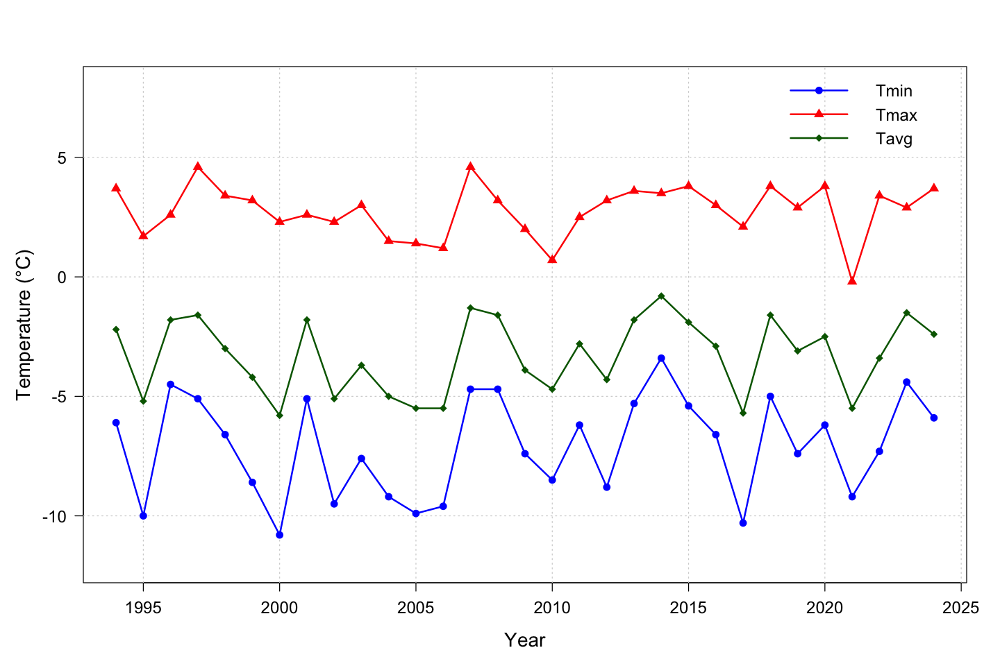

In [9]:
# Cambia size dell'immagine
options(repr.plot.width=12, repr.plot.height=8)

Tmin_gen <- dataset[["Auronzo"]][["Temperatura aria a 2m (_C) media delle minime"]][,"GEN"]
Tmax_gen <- dataset[["Auronzo"]][["Temperatura aria a 2m (_C) media delle massime"]][,"GEN"]
Tmean_gen <- dataset[["Auronzo"]][["Temperatura aria a 2m (_C) media delle medie"]][,"GEN"]

Tmin_gen <- suppressWarnings(as.numeric(Tmin_gen))
Tmax_gen <- suppressWarnings(as.numeric(Tmax_gen))

n <- min(length(Tmin_gen), length(Tmax_gen))
Tmin_gen <- Tmin_gen[1:n]
Tmax_gen <- Tmax_gen[1:n]
years <- 1994:(1994 + n - 1)

valid_idx <- !is.na(Tmin_gen) & !is.na(Tmax_gen)
years <- years[valid_idx]
Tmin_gen <- Tmin_gen[valid_idx]
Tmax_gen <- Tmax_gen[valid_idx]

# Imposta margini e dimensioni del testo
par(mar = c(5, 5, 4, 2), cex.axis = 1.2, cex.lab = 1.4, cex.main = 1.5, bg = "white")

# Plot vuoto con più spazio e più grande
plot(years, Tmin_gen, type = "n", 
     ylim = c(-12, 8), 
     xlab = "Year", ylab = "Temperature (°C)", 
     las = 1, cex = 1.2, cex.lab = 1.4, cex.axis = 1.2)

# Aggiungi griglia leggera
grid(col = "lightgray", lty = "dotted")

# Linee
lines(years, Tmin_gen, col = "blue", lwd = 2)
lines(years, Tmax_gen, col = "red", lwd = 2)
lines(years, Tmean_gen, col = "darkgreen", lwd = 2)

# Punti
points(years, Tmin_gen, col = "blue", pch = 16, cex = 1.2)
points(years, Tmax_gen, col = "red", pch = 17, cex = 1.2)
points(years, Tmean_gen, col = "darkgreen", pch = 18, cex = 1.2)

# Legenda migliorata
legend("topright", legend = c("Tmin", "Tmax", "Tavg"),
       col = c("blue", "red", "darkgreen"), 
       lty = 1, pch = c(16, 17, 18),
       lwd = 2, bty = "n", cex = 1.2)

# Part 1

## Linear regression

Linear regression for _year_-averages of different _monthly_-metrics:
- Average of maxima
- Average of mean values 
- Average of minima
Parametrization: $$ T_{avg} = mY + q$$

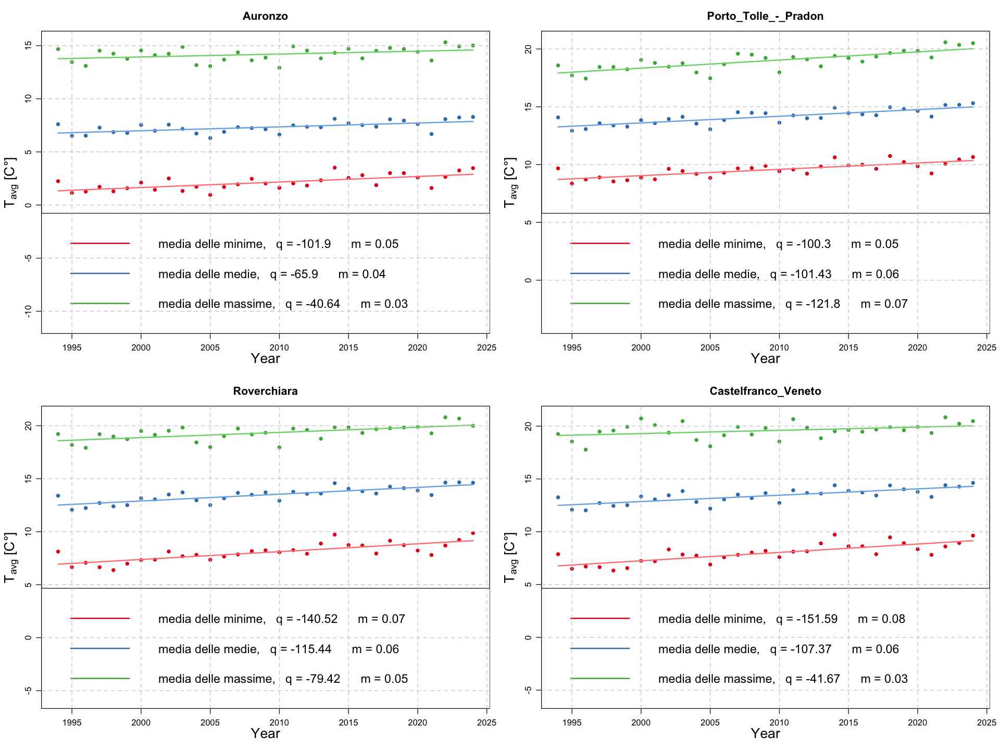

In [ ]:
options(repr.plot.width=16, repr.plot.height=12)

remove_parentheses <- function(x) {
  gsub("\\s*\\([^\\)]*\\)", "", x)
}


years <- 1994:2024
par(mfrow = c(2,2), bg = "white", mar=c(4,4,3,1)) 
par(mgp = c(2, 0.8, 0))

models <- list()

# Color palette 
metric_colors <- brewer.pal(3, "Set1") 
fit_colors <- lighten(metric_colors, amount = 0.4)

for (i in seq(1, length(stations_names))) {    
    name <- stations_names[i]
    
    # Compute average over months for each metric
    annual_dataset <- lapply(intresting_metrics, function(x) rowMeans(dataset[[name]][[x]]))
    
    # Create empty canvas 
    plot(
        NA,
        type="n",
        xlim=c(min(years), max(years)),
        ylim=c(min(unlist(annual_dataset))-12, max(unlist(annual_dataset))),
        cex.lab=1.6,
        main=name,
        font.main=2, cex.main=1.3,
        xlab="Year", ylab=bquote(T[avg] * " [C°]")
        )
    
    # Append parameters for legend display
    parameter_string <- c()

    for (j in 1:length(intresting_metrics)) {
        metric <- intresting_metrics[j]

        # Linear fit
        lin_model <- lm(annual_dataset[[j]] ~ years)
        annual_average_model <- predict(lin_model)
        parameter_string[j] <- paste0("q = ", round(lin_model$coefficients[1], 2), "      m = ", round(lin_model$coefficients[2], 2))

        # Plots
        points(x = years, y = annual_dataset[[j]], col = metric_colors[j], pch = 16)
        lines(years, annual_average_model, col=fit_colors[j], lwd=2)

        # Save models of for "Media delle medie"
        if (j == 2) models[[name]] <- lin_model
    }

    legend(
        'bottomleft',
        legend=paste0(substr(remove_parentheses(intresting_metrics), 23, 42),",   ", parameter_string),
        col=metric_colors,
        lwd=c(2, 2),
        cex=1.4
        )
    
    grid(col="gray80", lty=2) 

}

## Bayesian regression with STAN

Bayesian linear regression between temperature $T$ and year $y$: $$ T_i \sim Norm(a+y_i*b, \sigma). $$
Constant regression between $T$ and $y$ (i.e. temperature is independant of the year): $$ T_i \sim Norm(\mu, \sigma). $$

In [11]:
stan_regression <- function(model, iterations, n_chains=3, warmup=200) {
    
    ################################
    #
    # Plots MCMC for parameters of the chosen model and outputs best values of such parameters, given by the average of the MCMC final values.
    #
    # PARAMETERS:
    # model: 'linear', 'const'
    # iterations: number of steps of the chain
    # warmup: number of neglected initial steps
    #
    ################################
    
    # Picks the file in which the model is contained
    models_list <- list(
        const = "constant_model.stan",
        linear = "linear_model.stan"
    )

    params_list <- list(
        const = c("k", "sigma"),
        linear = c("a", "b", "sigma")
    )

    options(repr.plot.width=12, repr.plot.height=8)

    best_values = list()

    # Create Dynamic shared object
    stan_DSO <- stan_model(file = models_list[[model]])
    params   <- params_list[[model]]

    for (name in stations_names) {
        lin_model <- models[[name]]

        # Create data list for Stan sampling
        annual_average <- rowMeans(dataset[[name]][["Temperatura aria a 2m (_C) media delle medie"]])
        N              <- length(years)

        # Depending on the model we have different datasets and initializations
        if (model == 'linear') {

            data_list <- list(N = N, years = years, avg_temp = annual_average)
            data_init <- list(a = lin_model$coefficients[[1]], b = lin_model$coefficients[[2]], sigma = 0.5)

        } else if (model == 'const') {

            data_list <- list(N = N, avg_temp = annual_average)
            data_init <- list(k = mean(annual_average), sigma = 0.5)

        }

        # Generate MCMC
        suppressWarnings({
            stan_fit <- sampling(
                object = stan_DSO,
                data = data_list,
                chains = n_chains,
                iter = iterations,
                warmup = warmup,
                init = rep(list(data_init), n_chains),
                show_messages = FALSE, # Suppress messages
                refresh = 0            # Suppress progress lines
            )
        })

        # Plot Markov chain from Stan fit
        trace_plot <-  (
            mcmc_trace(stan_fit, pars = params) + 
            theme(
                axis.title = element_text(size = 18),   
                axis.text = element_text(size = 14),    
                strip.text = element_text(size = 15, face = "bold")
            )
        )
 
        # Plot histogram 
        hist_plot <- (
            mcmc_hist(stan_fit, pars = params, bins = floor(sqrt(iterations))) +
            theme(
                axis.title = element_text(size = 18),
                axis.text = element_text(size = 14),
                strip.text = element_text(size = 15, face = "bold")
            )
        )
        
        print(trace_plot/hist_plot)

        # Get data from MCMCM and compute best values
        MCMC_data <- as.data.frame(stan_fit)
        best_values[[name]] <- colMeans(MCMC_data)
    }

    return(best_values)
}

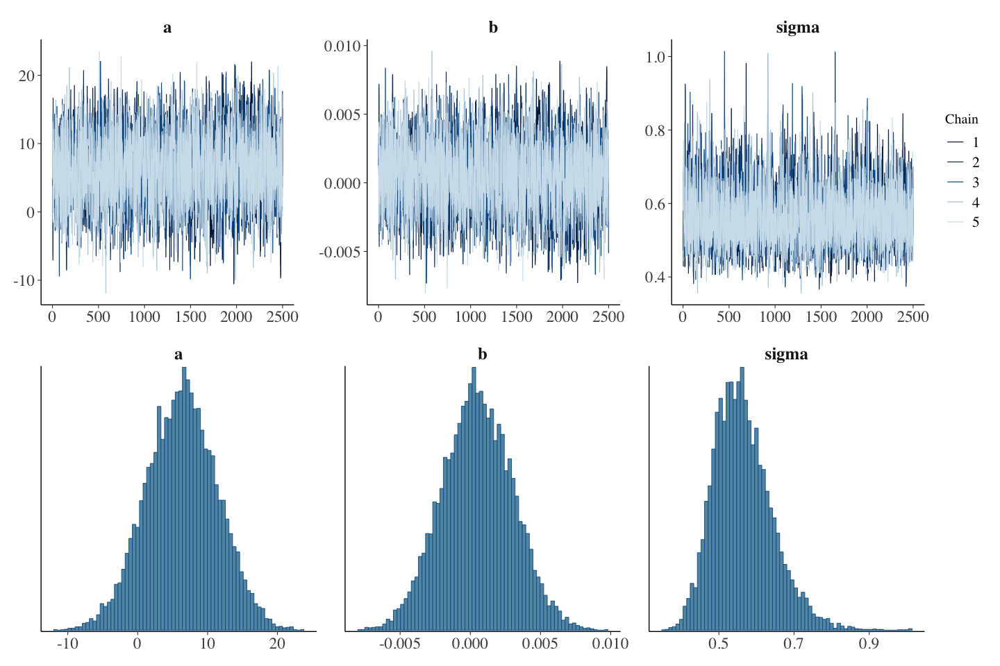

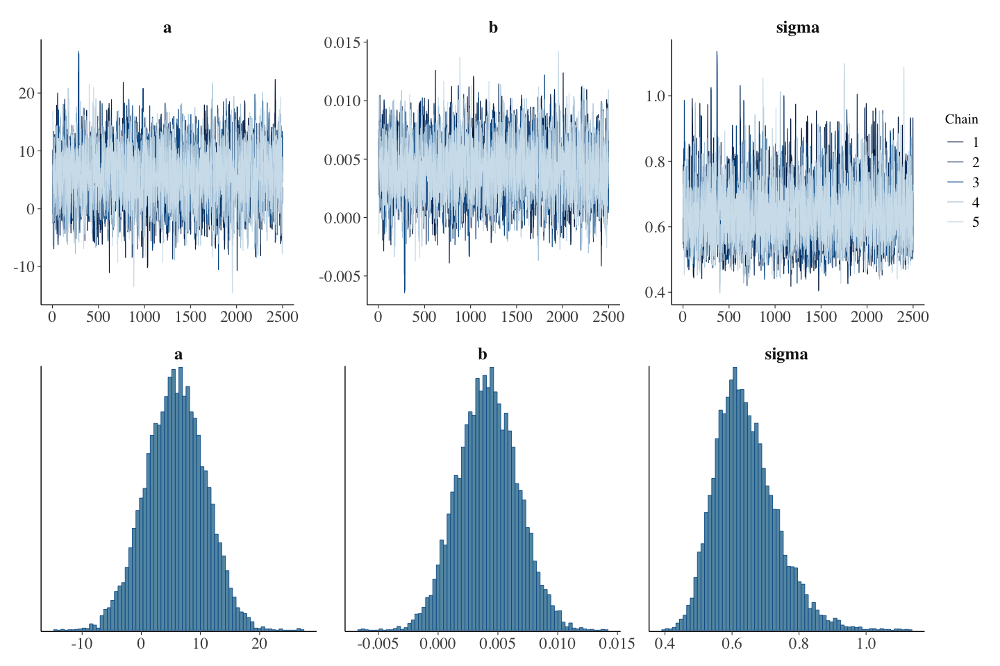

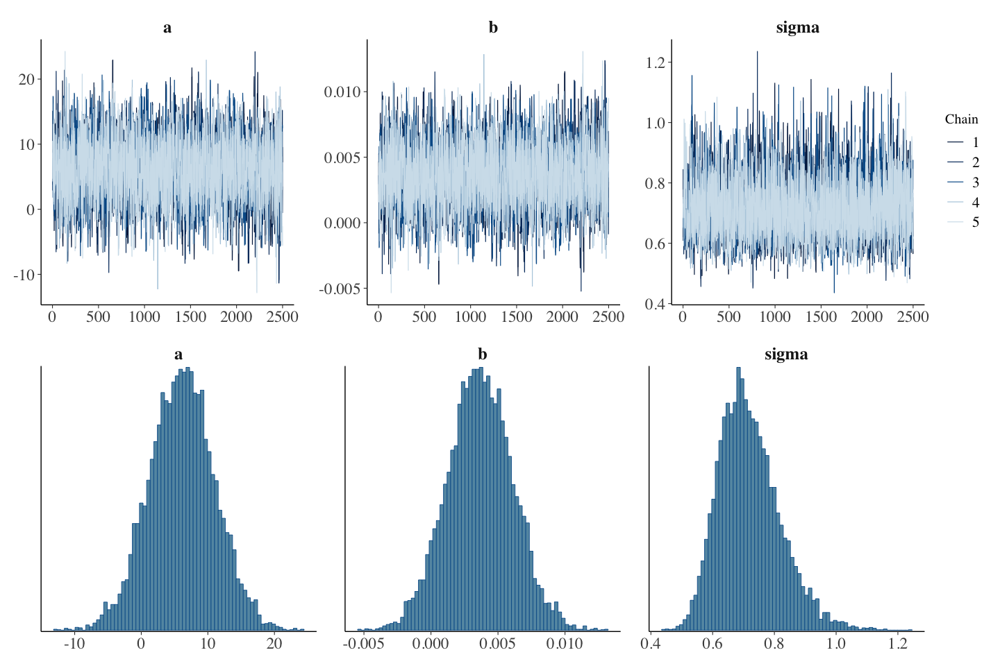

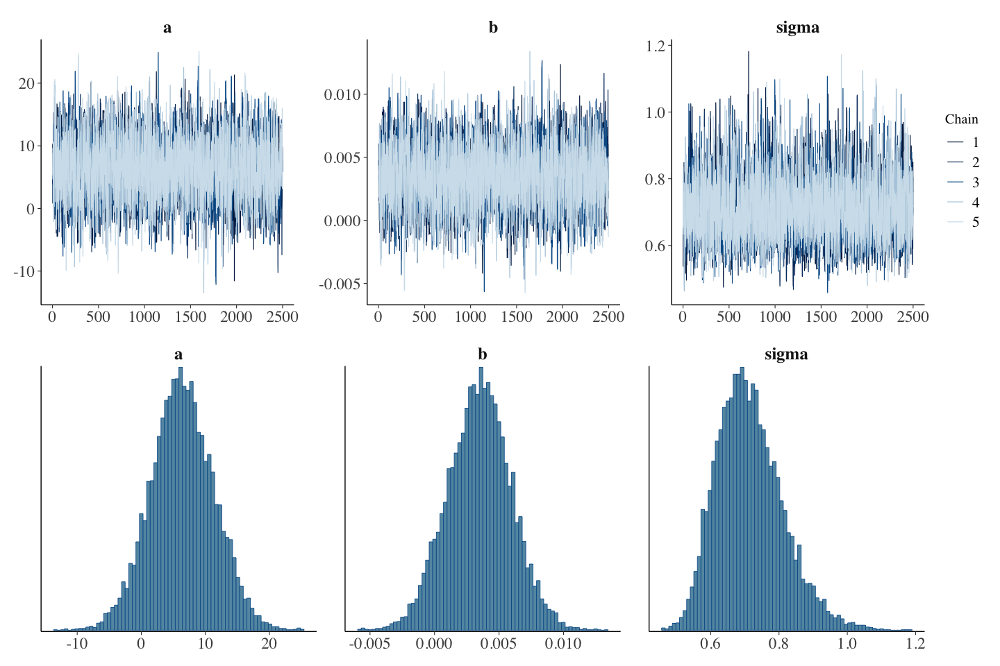

In [12]:
iterations <- 5e3
linear_best_val <- stan_regression('linear', iterations, warmup=iterations/2, n_chains=n_cores)

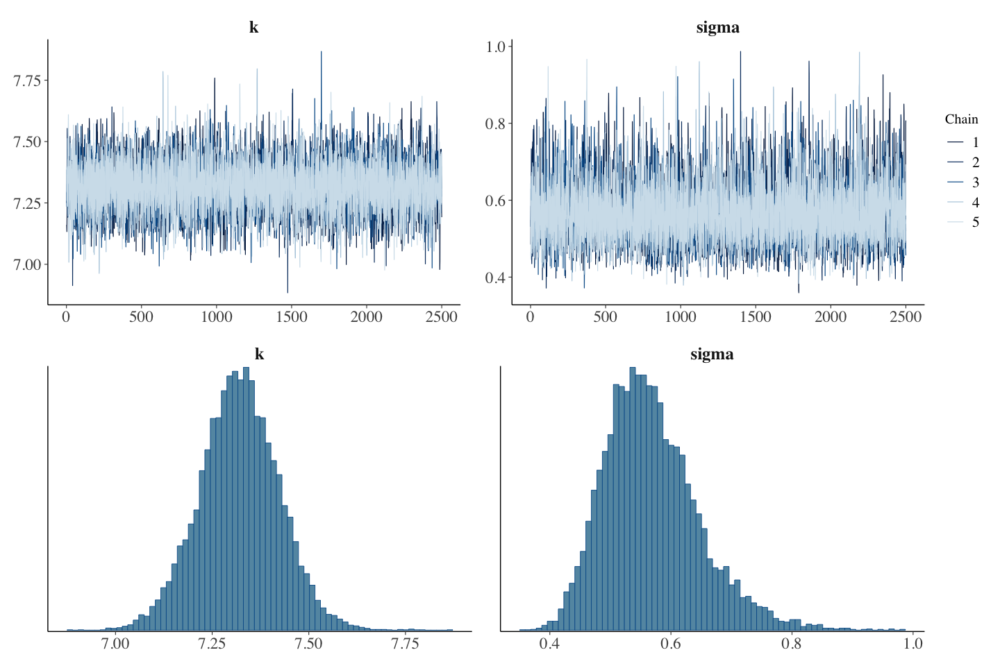

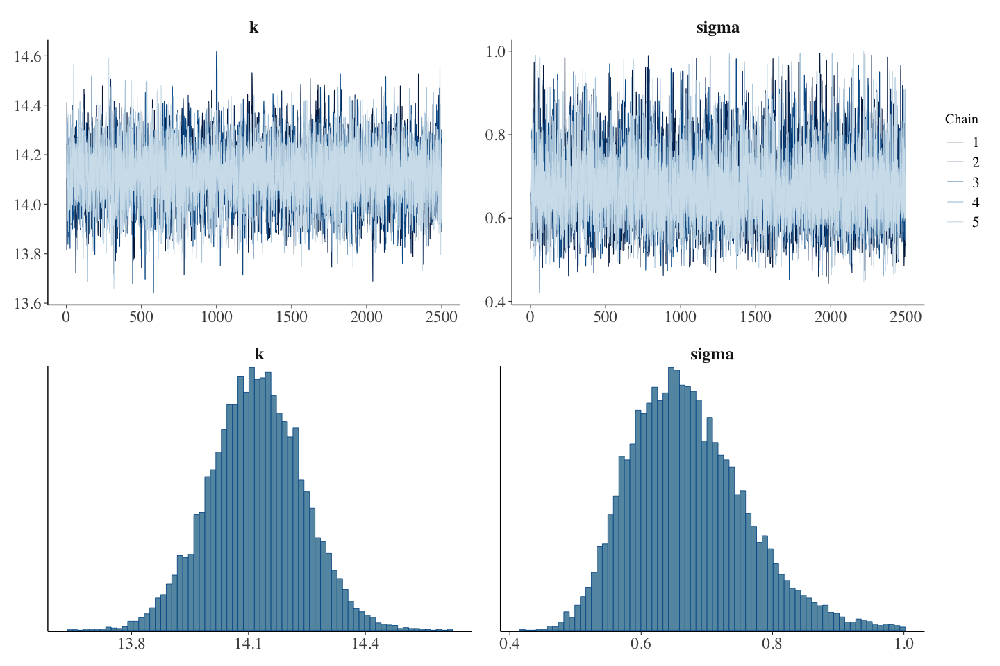

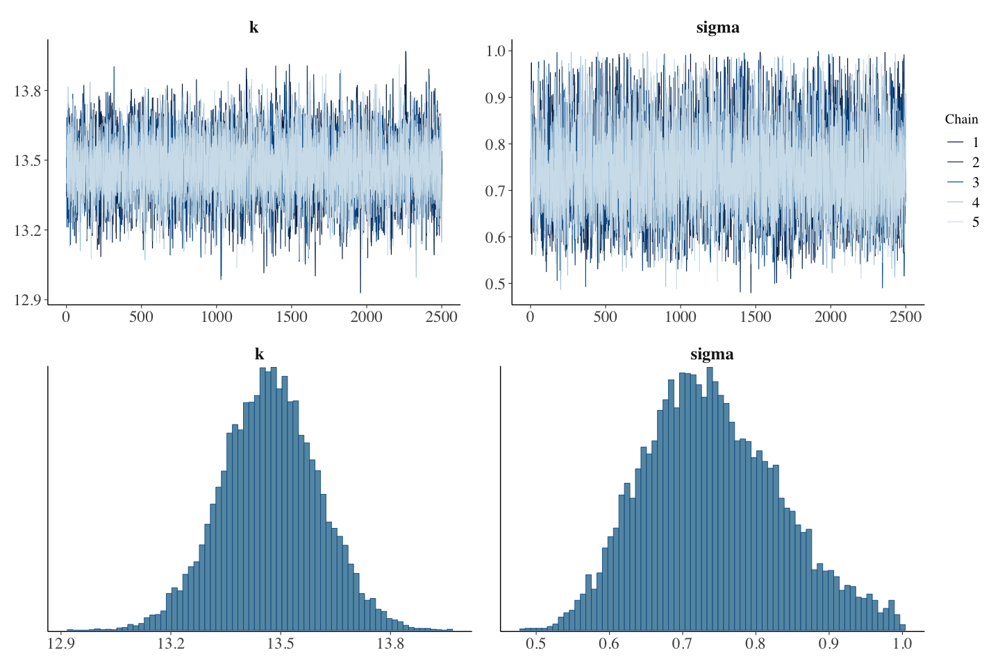

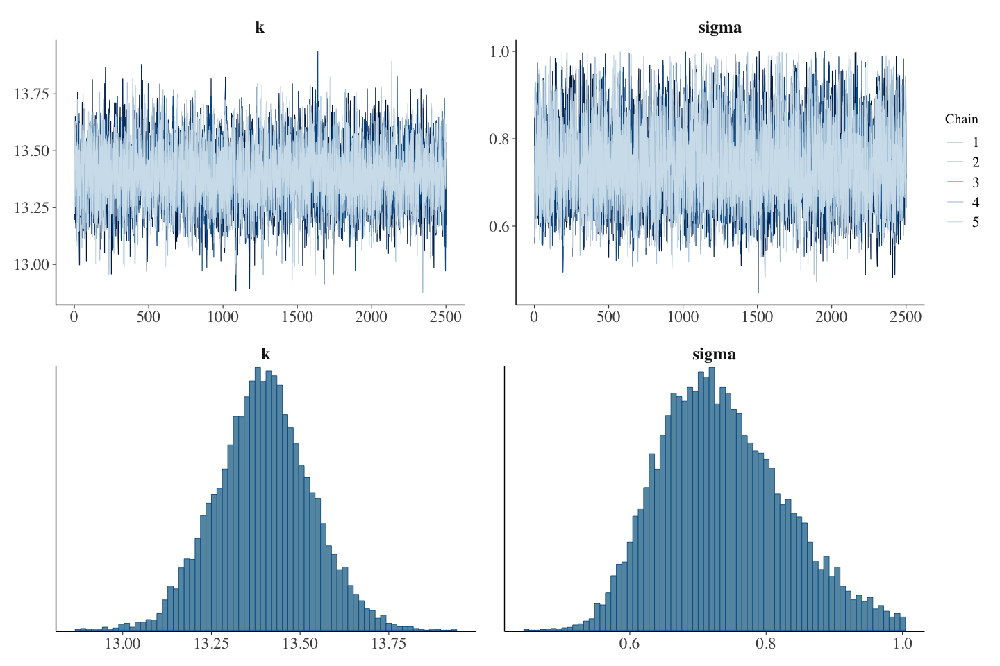

In [13]:
iterations <- 5e3
const_best_val <- stan_regression('const', iterations, warmup=iterations/2, n_chains=n_cores)

In [14]:
cat("Best values of parameters for Bayesian linear model:, \n")
print(as.data.frame(linear_best_val))
cat('\n\n')
cat("Best values of parameters for constant model:, \n")
print(as.data.frame(const_best_val))

Best values of parameters for Bayesian linear model:, 
           Auronzo Porto_Tolle_._Pradon  Roverchiara Castelfranco_Veneto
a     6.3092173755          5.779773638  6.109526903           6.4326868
b     0.0005042663          0.004153559  0.003667125           0.0034686
sigma 0.5646627688          0.642076582  0.719418491           0.7144937
lp__  1.6427360423         -2.355223416 -5.533198273          -5.4477287


Best values of parameters for constant model:, 
        Auronzo Porto_Tolle_._Pradon Roverchiara Castelfranco_Veneto
k     7.3203460           14.1196181   13.471535          13.3963937
sigma 0.5684389            0.6719472    0.740851           0.7362503
lp__  2.1301799           -3.2079772   -6.083129          -5.9193166


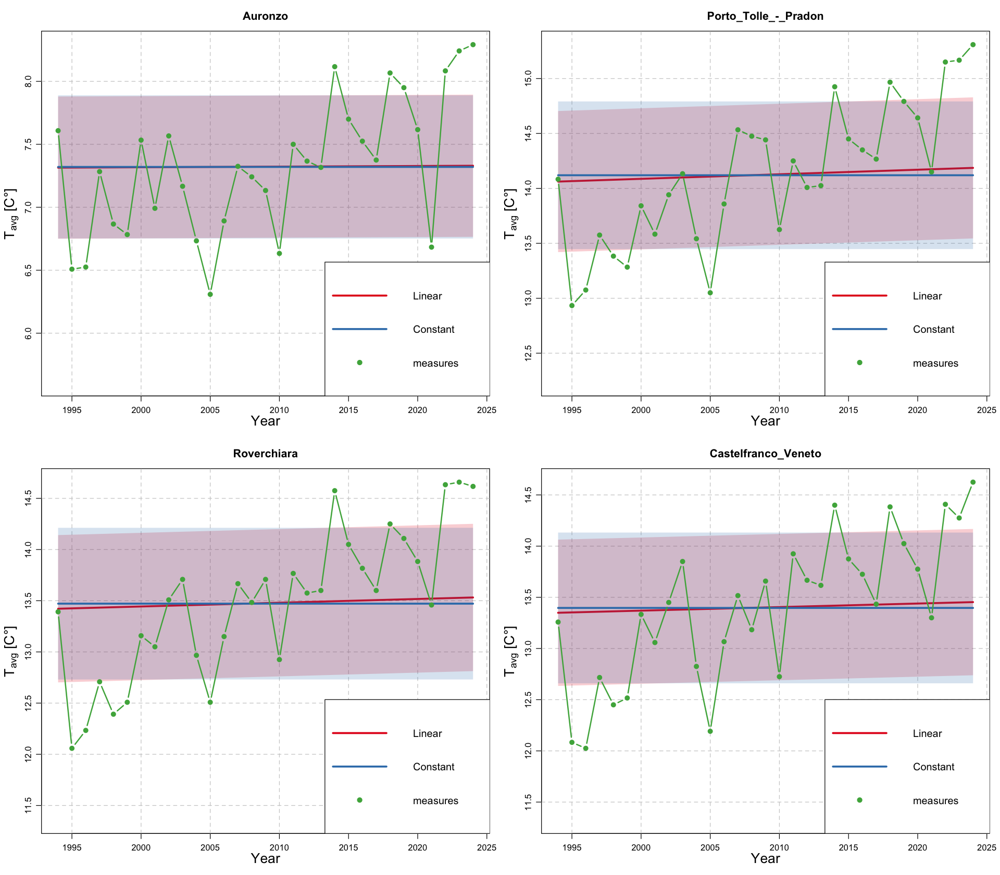

In [15]:
options(repr.plot.width=16, repr.plot.height=14)
par(mfrow = c(2,2), bg = "white", mar=c(4,4,3,1)) 
par(mgp = c(2, 0.8, 0))

# Color palette 
fit_colors <- brewer.pal(3, "Set1") 
halo_colors <- adjustcolor(fit_colors, alpha.f = 0.2)

for (i in 1:length(stations_names)) {
    name <- stations_names[[i]]
    annual_average <- rowMeans(dataset[[name]][["Temperatura aria a 2m (_C) media delle medie"]])

    lin_coeffs <- linear_best_val[[name]]
    const_coeffs <- const_best_val[[name]]

    # Plot empty canvas
    plot(years, annual_average, type="n",
        ylim = c(min(unlist(annual_average)-0.7), max(unlist(annual_average))),
        cex.lab=1.6,
        main=name,
        font.main=2, cex.main=1.3,
        xlab="Year", ylab=bquote(T[avg] * " [C°]"))
    
    grid(col="gray80", lty=2) 
    
    # Plot fitted lines with error
    x_poly <- c(years, rev(years))

    ## For linear model
    lin_y_poly <- c(years*lin_coeffs[['b']] + lin_coeffs[['a']] + lin_coeffs[['sigma']], rev( years*lin_coeffs[['b']] + lin_coeffs[['a']] - lin_coeffs[['sigma']]))

    polygon(x_poly, lin_y_poly, col = halo_colors[1], border = NA)
    lines(years, years*lin_coeffs[['b']] + lin_coeffs[['a']], col=fit_colors[1], lwd=3)

    ## For constant model
    const_y_poly <- c(years*0 + const_coeffs[['k']] + const_coeffs[['sigma']], rev( years*0 + const_coeffs[['k']] - const_coeffs[['sigma']]))
    
    polygon(x_poly, const_y_poly, col = halo_colors[2], border = NA)
    lines(years, years*0 + const_coeffs[['k']], col=fit_colors[2], lwd=3)

    #Plot actual points
    points(years, annual_average, type="b", pch=19, col=fit_colors[3], lwd=2)

    legend(
        'bottomright', 
        legend = c("Linear", "Constant", "measures"), 
        col = fit_colors, 
        lwd = c(3, 3, NA),
        pch = c(NA, NA, 19),
        cex = 1.2,
        # bty = "n",
        inset = c(-0.15, 0)
        )

} 

__ISPRA plot:__

![image](ISPRA-temperature.png)

## Hypothesis comparison

We perform the hypothesis comparison by computing the __Bayes factor__ $$ BF = \frac{\mathcal{L}(D, H_1)}{\mathcal{L}(D, H_2)}, $$ where $\mathcal{L}(D, H)$ is the likelihood of the data according to the hypothesis $H$. If $BF \gg 1$ we conclude that hypothesis $H_1$ is more supported by data than $H_2$. <br>
In our case
$$ 
\begin{align*}

\mathcal{L}(D, H_{\text{lin}}) 
&= \prod_{i=1}^N \text{Prob}(T_i | y_i, a, b, \sigma) \\
&= \prod_{i=1}^N \text{Norm}(T_i | a+b*y_i, \sigma)

\end{align*}
$$

$$
\begin{align*}

\mathcal{L}(D, H_{\text{const}}) 
&= \prod_{i=1}^N \text{Prob}(T_i| k, \sigma) \\
&= \prod_{i=1}^N \text{Norm}(T_i | k, \sigma)

\end{align*}
$$

In [16]:
likelihoods <- list()

for (name in stations_names) {
    lin_params <- linear_best_val[[name]]
    const_params <- const_best_val[[name]]
    
    likelihood <- list(const = 1, linear = 1)

    annual_average <- rowMeans(dataset[[name]][["Temperatura aria a 2m (_C) media delle medie"]])

    # Compute likelihood for both models
    likelihood$const <- prod(dnorm(annual_average, const_params[['k']], const_params[['sigma']]))
    likelihood$linear <- prod(dnorm(annual_average, lin_params[['b']]*years + lin_params[['a']], lin_params[['sigma']]))
    cat("Stazione: ", name, "\n\n")
    cat("Likelihood for linear model: ", likelihood$linear, "\n")
    cat("Likelihood for constant model: ", likelihood$const, "\n")
    cat("Bayes factor (lineare/costante): ",likelihood$linear / likelihood$const ,"\n\n\n")
}

Stazione:  Auronzo 

Likelihood for linear model:  2.265187e-11 
Likelihood for constant model:  1.921456e-11 
Bayes factor (lineare/costante):  1.178891 


Stazione:  Porto_Tolle_-_Pradon 

Likelihood for linear model:  4.02527e-13 
Likelihood for constant model:  9.19893e-14 
Bayes factor (lineare/costante):  4.375802 


Stazione:  Roverchiara 

Likelihood for linear model:  1.341062e-14 
Likelihood for constant model:  4.187494e-15 
Bayes factor (lineare/costante):  3.20254 


Stazione:  Castelfranco_Veneto 

Likelihood for linear model:  1.409433e-14 
Likelihood for constant model:  4.927206e-15 
Bayes factor (lineare/costante):  2.860511 




## Correlations between different stations

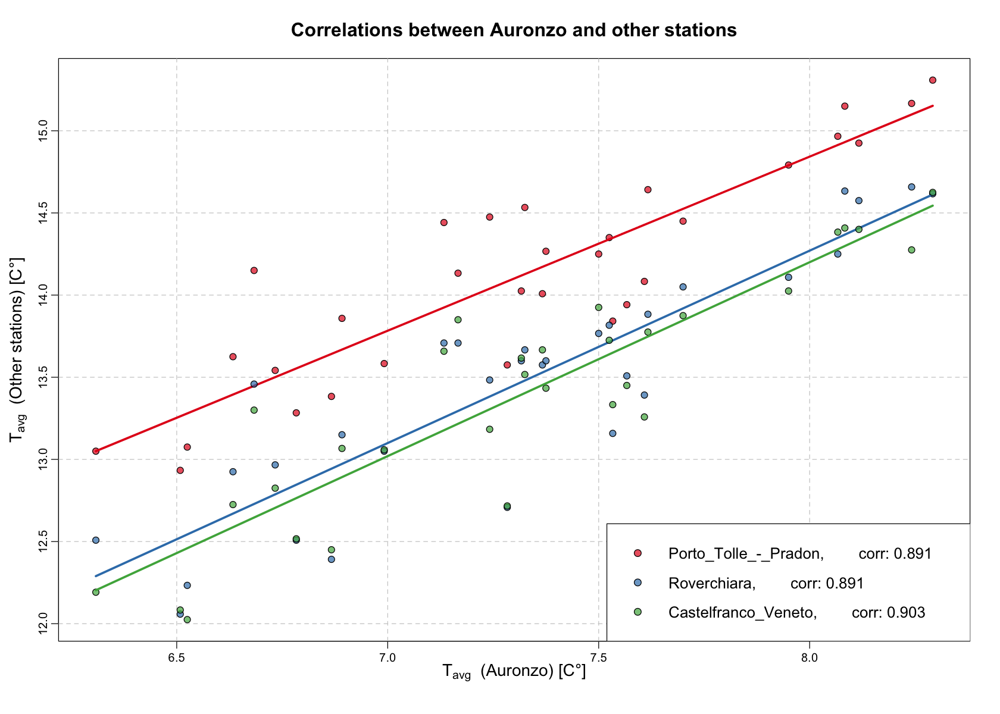

In [250]:
options(repr.plot.width=14, repr.plot.height=10)
par(bg = "white")
par(mgp = c(2, 0.6, 0))

# Color palette 
fit_colors <- brewer.pal(3, "Set1") 
points_colors <- adjustcolor(fit_colors, alpha.f = 0.7)

avg_temp <- "Temperatura aria a 2m (_C) media delle medie"
# names_pairs <- combn(stations_names, 2)

# Find common xlims and ylims for every pair of city
minT_for_station <- sapply(stations_names[2:4], function(name) min(unlist(rowMeans(dataset[[name]][[avg_temp]]))))
maxT_for_station <- sapply(stations_names[2:4], function(name) max(unlist(rowMeans(dataset[[name]][[avg_temp]]))))
extrema <- c(min(minT_for_station), max(maxT_for_station))

# Plot empty canvas
plot(
    NA,
    NA,
    type = 'n',
    xlab = bquote(T[avg] * "  (Auronzo) [C°]"),
    ylab = bquote(T[avg] * "  (Other stations) [C°]"),
    cex.lab = 1.4,
    cex.main = 1.6,
    ylim = extrema,
    xlim = c(6.3, 8.3),
    main = "Correlations between Auronzo and other stations",
)
grid(col="gray80", lty=2)
lin_corr <- list()

for (i in 2:4) {
    temp1 <- rowMeans(dataset[[stations_names[1]]][[avg_temp]]) # Auronzo's average temperature
    temp2 <- rowMeans(dataset[[stations_names[i]]][[avg_temp]]) # Other station's temperature

    # Pearson linear correlation
    lin_corr[[stations_names[i]]] <- cor(temp1, temp2)

    # Linear fit (just for plotting sake)
    lin_model <- lm(temp2 ~ temp1)
    coeffs <- lin_model$coefficients
    predict_temp <- predict(lin_model)

    points(temp1, temp2, pch = 21, bg = points_colors[i-1], col = 'black', cex = 1.2)
    lines(temp1, predict_temp, col = fit_colors[i-1], lwd = 3)
}

legend(
    'bottomright',
    legend = sapply(stations_names[2:4], function(name) paste0(name, ",        corr: ", round(lin_corr[[name]], 3))),
    pch = rep(21, 3),
    col = rep('black', 3),
    pt.bg = points_colors,
    cex = 1.3,
    inset = c(-0.35, 0)
)


In [ ]:
names_pairs <- combn(stations_names, 2)

for (i in 1:ncol(names_pairs)) {
    pair <- names_pairs[, i]

    temp1 <- rowMeans(dataset[[pair[1]]][[avg_temp]])
    temp2 <- rowMeans(dataset[[pair[2]]][[avg_temp]])

    # Pearson linear correlation
    lin_corr <- cor(temp1, temp2)

    cat(paste0("Correlation between ", pair[1], " and ", pair[2], ": \n"))
    print(round(lin_corr, 3))
    cat('\n')
}

Correlation between Auronzo and Porto_Tolle_-_Pradon: 
[1] 0.891

Correlation between Auronzo and Roverchiara: 
[1] 0.891

Correlation between Auronzo and Castelfranco_Veneto: 
[1] 0.903

Correlation between Porto_Tolle_-_Pradon and Roverchiara: 
[1] 0.972

Correlation between Porto_Tolle_-_Pradon and Castelfranco_Veneto: 
[1] 0.947

Correlation between Roverchiara and Castelfranco_Veneto: 
[1] 0.98



# Part 2

Analysis of the evolution of the annual di!erence of the min, max and daily averate temperature over
time (1994 - 2024)

In [18]:
#Create a new dataset with the differences

dif_dataset <- list()

for (name in stations_names) {
    dif_dataset[[name]][["min"]] <- diff(rowMeans(dataset[[name]][["Temperatura aria a 2m (_C) media delle minime"]]))#abs(apply(dataset[[name]][["Temperatura aria a 2m (_C) media delle minime"]],1, max)-apply(dataset[[name]][["Temperatura aria a 2m (_C) media delle minime"]],1, min))
    dif_dataset[[name]][["max"]] <- diff(rowMeans(dataset[[name]][["Temperatura aria a 2m (_C) media delle massime"]]))
    dif_dataset[[name]][["avg"]] <- diff(rowMeans(dataset[[name]][["Temperatura aria a 2m (_C) media delle medie"]]))
}

measures <- c("min", "max", "avg")
dif_dataset_add <- list()
dif_data <- list()
for (name in stations_names) {
        for (measure in measures){
            lin_model <- models[[name]]

            dif_dataset_add[[name]][[measure]] <- c(dif_dataset[[name]][[measure]], dif_dataset[[name]][[measure]][29:30])
            dif_data_matrix <- matrix(dif_dataset_add[[name]][[measure]], ncol = 4,)
            dif_data[[name]][[measure]] <- rowMeans(dif_data_matrix)
       }
}

In [19]:
stan_regression_4_years <- function(iterations, n_chains=3, warmup=200, show = FALSE, measures = c("min", "max", "avg")) {
    
    ################################
    #
    # Plots MCMC for parameters of the linear model and outputs best values of such parameters, given by the average of the MCMC final values.
    #
    # PARAMETERS:
    # iterations: number of steps of the chain
    # n_chains: number of MCMC executed
    # warmup: number of neglected initial steps
    #
    ################################
    
    # Picks the file in which the model is contained
    model <- "linear_model.stan"

    options(repr.plot.width=12, repr.plot.height=8)

    best_values = list()

    # Create Dynamic shared object
    stan_DSO <- stan_model(file = model)
    params   <- c("a", "b", "sigma")

    for (name in stations_names) {
        for (measure in measures){
            lin_model <- models[[name]]

            dif_dataset[[name]][[measure]] <- c(dif_dataset[[name]][[measure]], dif_dataset[[name]][[measure]][29:30])
            dif_data_matrix <- matrix(dif_dataset[[name]][[measure]], ncol = 4,)
            dif_data <- rowMeans(dif_data_matrix)

            years <- 1:8
            
            data_list <- list(N = length(years), years = years, avg_temp = dif_data)
            data_init <- list(a = lin_model$coefficients[[1]], b = lin_model$coefficients[[2]], sigma = 0.5)
    
            # Generate MCMC
            suppressWarnings({
                stan_fit <- sampling(
                    object = stan_DSO,
                    data = data_list,
                    chains = n_chains,
                    iter = iterations,
                    warmup = warmup,
                    #init = rep(list(data_init), n_chains),
                    show_messages = FALSE, # Suppress messages
                    refresh = 0            # Suppress progress lines
                )
            })
            if (show == TRUE){
                # Plot Markov chain from Stan fit
                trace_plot <-  (
                    mcmc_trace(stan_fit, pars = params) + 
                    theme(
                        axis.title = element_text(size = 18),   
                        axis.text = element_text(size = 14),    
                        strip.text = element_text(size = 15, face = "bold")
                    )
                )
         
                # Plot histogram 
                hist_plot <- (
                    mcmc_hist(stan_fit, pars = params, bins = floor(sqrt(iterations))) +
                    theme(
                        axis.title = element_text(size = 18),
                        axis.text = element_text(size = 14),
                        strip.text = element_text(size = 15, face = "bold") 
                    )
                )
                
                print(trace_plot/hist_plot)
            }

            # Get data from MCMCM and compute best values
            MCMC_data <- as.data.frame(stan_fit)
            best_values[[name]][[measure]] <- colMeans(MCMC_data)
        }
    }

    return(best_values)

}

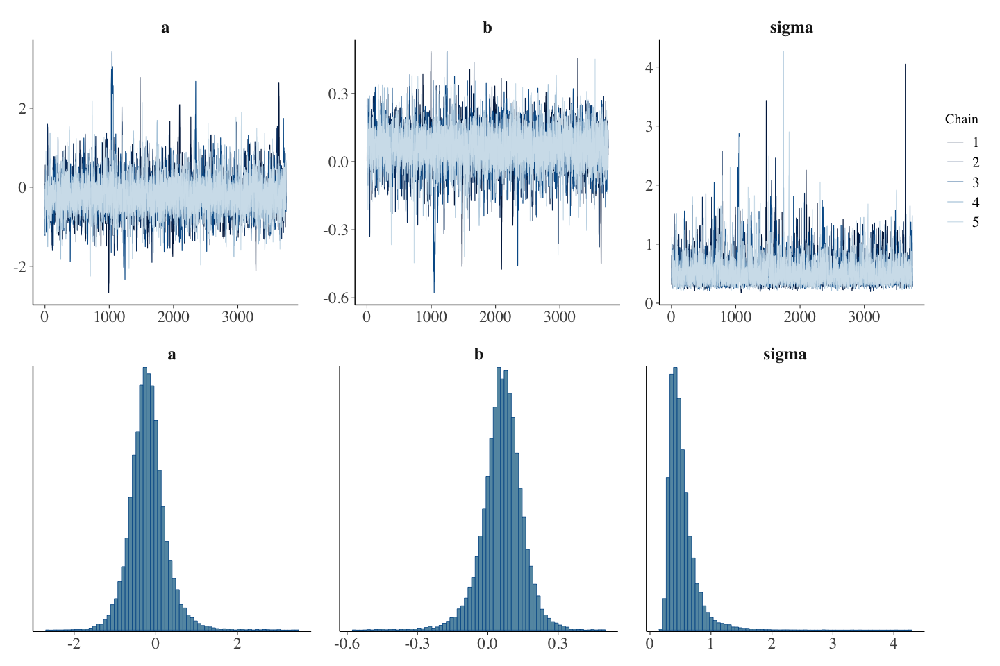

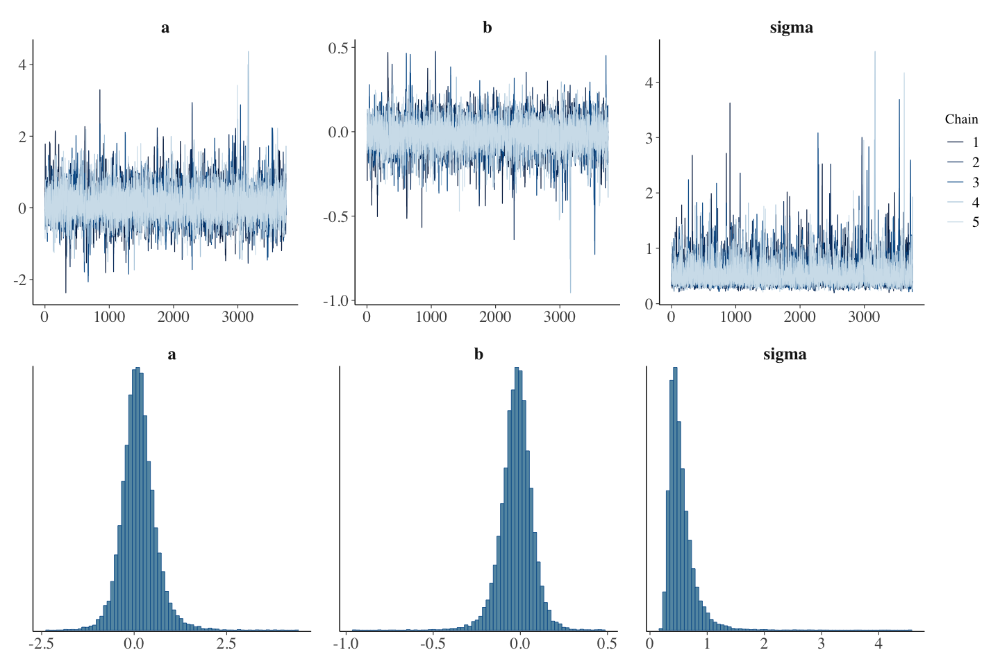

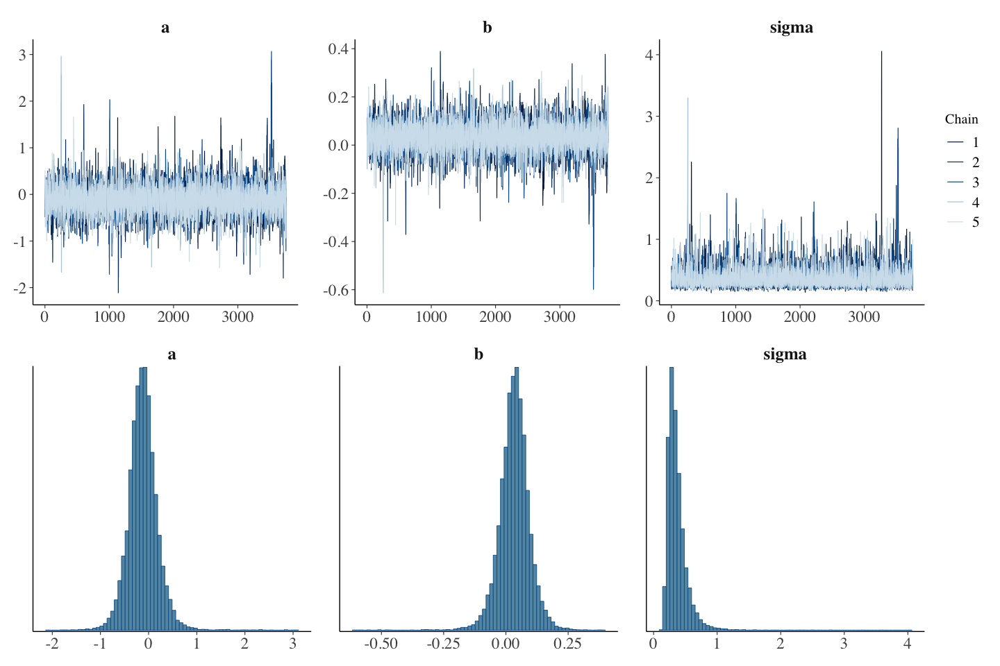

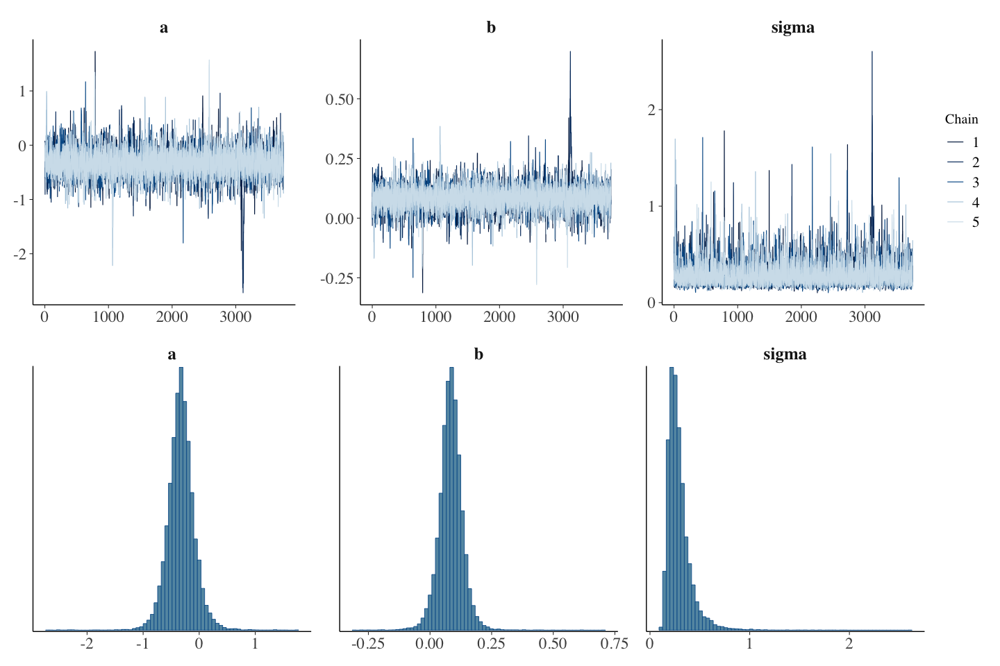

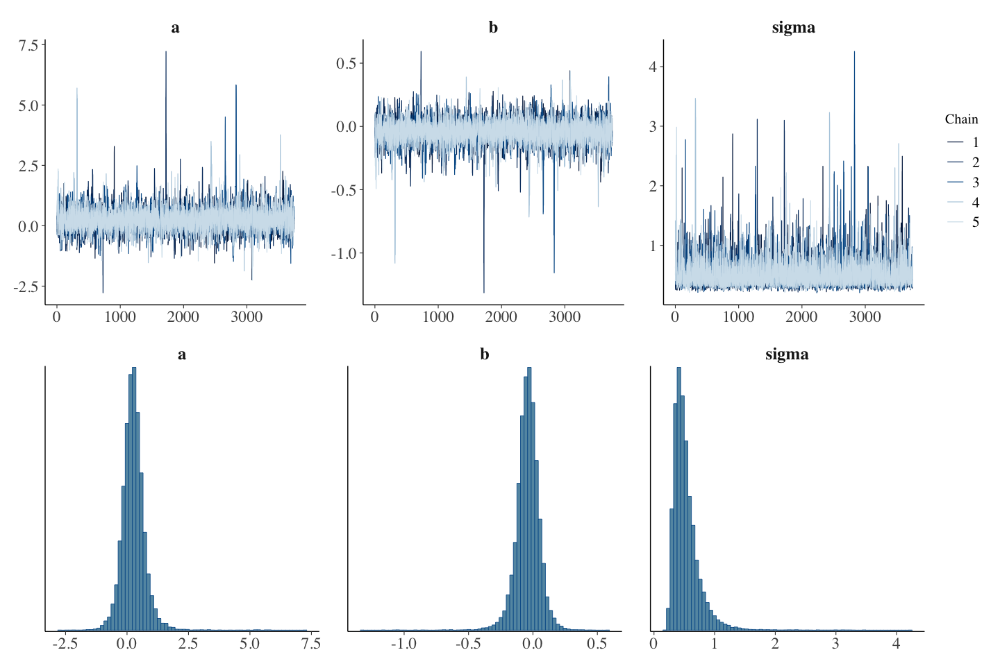

...

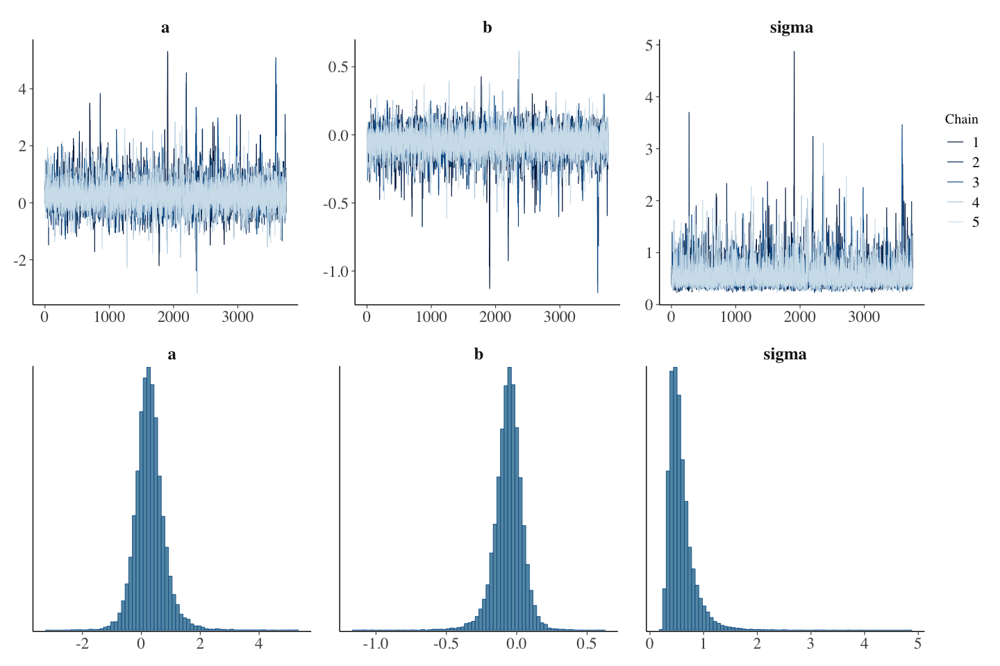

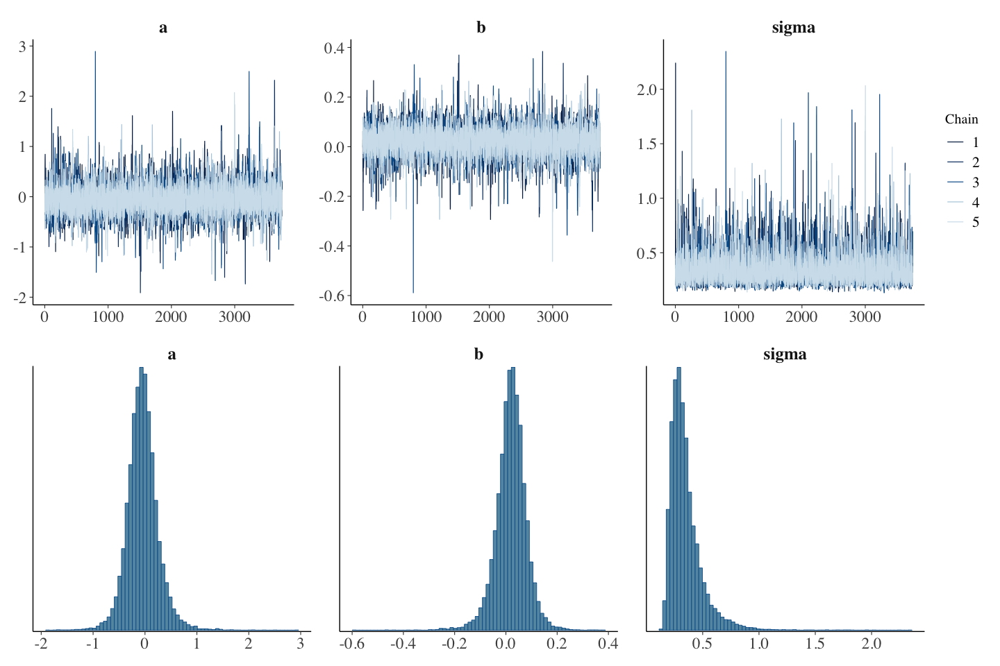

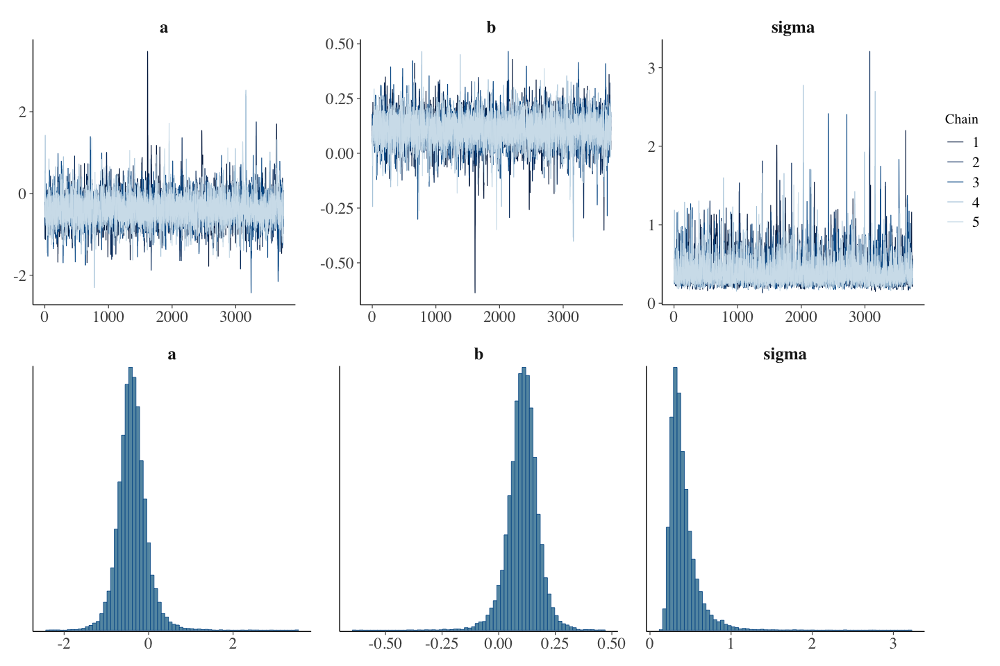

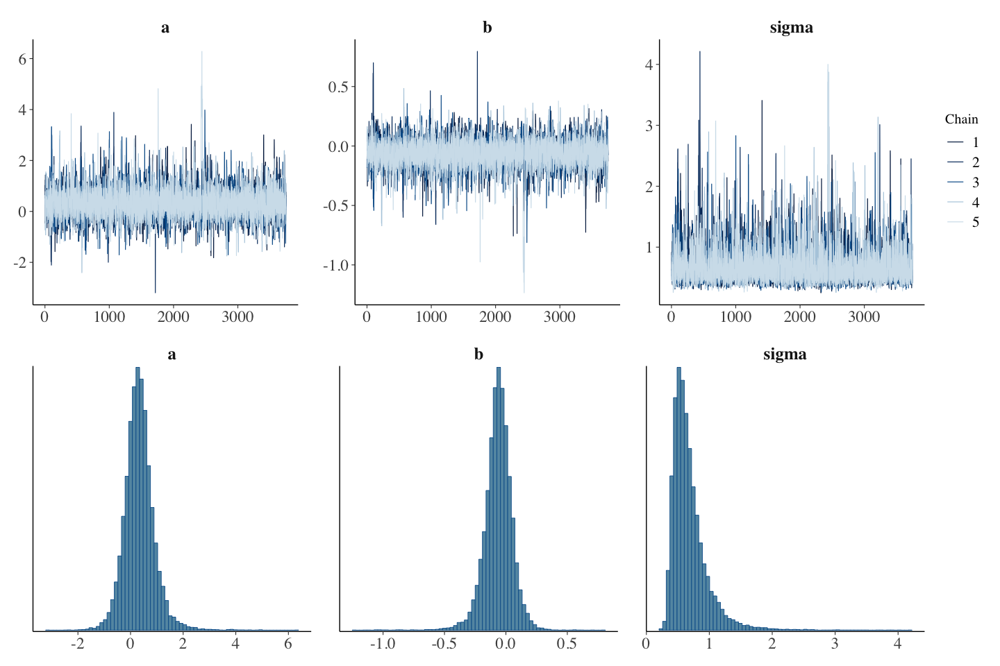

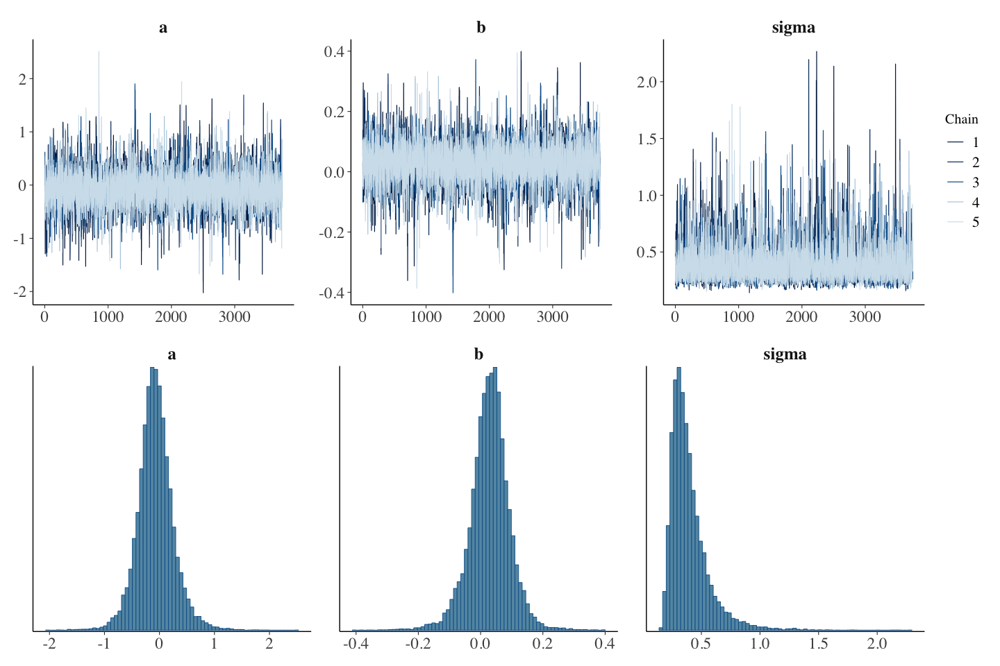

In [20]:
iterations <- 5e3
linear_best_val <- stan_regression_4_years(iterations, warmup=iterations/4, n_chains=n_cores, show = TRUE, measures = measures)

In [21]:
linear_best_val

$Auronzo
$Auronzo$min
          a           b       sigma        lp__ 
-0.19559475  0.06091587  0.52401748 -0.54385029 

$Auronzo$max
          a           b       sigma        lp__ 
 0.12102342 -0.02268909  0.54612354 -0.75763195 

$Auronzo$avg
          a           b       sigma        lp__ 
-0.11726082  0.03388108  0.36787122  1.94748707 


$`Porto_Tolle_-_Pradon`
$`Porto_Tolle_-_Pradon`$min
          a           b       sigma        lp__ 
-0.32447589  0.08420722  0.29127432  3.46683720 

$`Porto_Tolle_-_Pradon`$max
          a           b       sigma        lp__ 
 0.25920171 -0.04131789  0.52937950 -0.44904817 

$`Porto_Tolle_-_Pradon`$avg
          a           b       sigma        lp__ 
-0.03768246  0.01999658  0.36289212  2.04659500 


$Roverchiara
$Roverchiara$min
         a          b      sigma       lp__ 
-0.3657473  0.1028877  0.3431291  2.3102325 

$Roverchiara$max
          a           b       sigma        lp__ 
 0.28509648 -0.05937694  0.57997600 -1.09530187 

$Roverchiara$avg
          a           b       sigma        lp__ 
-0.04565541  0.01999318  0.34975050  2.28574643 


$Castelfranco_Veneto
$Castelfranco_Veneto$min
         a          b      sigma       lp__ 
-0.3850629  0.1069054  0.4071724  1.1384335 

$Castelfranco_Veneto$max
          a           b       sigma        lp__ 
 0.33291810 -0.06303267  0.68534473 -2.26315001 

$Castelfranco_Veneto$avg
          a           b       sigma        lp__ 
-0.07189287  0.02905203  0.39630097  1.40539531

In [22]:
dif_data

$Auronzo
$Auronzo$min
[1] -0.4666667 -0.0250000 -0.2020833  0.6416667  0.0437500  0.3812500 -0.3604167
[8]  0.5020833

$Auronzo$max
[1]  0.33750000 -0.68541667 -0.05208333  0.63750000  0.05208333 -0.19583333
[7]  0.03333333 -0.11666667

$Auronzo$avg
[1] -0.18750000 -0.22083333 -0.16250000  0.59166667  0.02291667  0.13541667
[7] -0.16041667  0.20416667


$`Porto_Tolle_-_Pradon`
$`Porto_Tolle_-_Pradon`$min
[1] -0.46666667 -0.15208333 -0.04791667  0.43125000  0.04375000  0.12916667
[7]  0.01458333  0.43750000

$`Porto_Tolle_-_Pradon`$max
[1]  0.24583333 -0.32708333 -0.16666667  0.85625000  0.07291667  0.14375000
[7] -0.08333333 -0.27916667

$`Porto_Tolle_-_Pradon`$avg
[1] -0.12708333 -0.21041667 -0.11666667  0.62916667  0.02916667  0.13541667
[7] -0.08958333  0.09583333


$Roverchiara
$Roverchiara$min
[1] -0.53541667 -0.07291667 -0.08750000  0.44166667  0.08750000  0.31666667
[7] -0.02708333  0.61041667

$Roverchiara$max
[1]  0.2812500 -0.4375000 -0.1500000  0.8520833  0.0875000 -0.2479167  0.0062500
[8] -0.3979167

$Roverchiara$avg
[1] -0.10833333 -0.24583333 -0.09583333  0.61875000  0.03333333  0.04791667
[7] -0.01875000  0.07083333


$Castelfranco_Veneto
$Castelfranco_Veneto$min
[1] -0.47500000 -0.10416667 -0.17291667  0.49583333 -0.07708333  0.40000000
[7] -0.07500000  0.70416667

$Castelfranco_Veneto$max
[1]  0.55208333 -0.75416667 -0.12083333  0.81875000  0.16875000  0.03541667
[7] -0.10416667 -0.37916667

$Castelfranco_Veneto$avg
[1]  0.01666667 -0.39791667 -0.11666667  0.62500000 -0.03541667  0.17083333
[7] -0.05625000  0.18958333

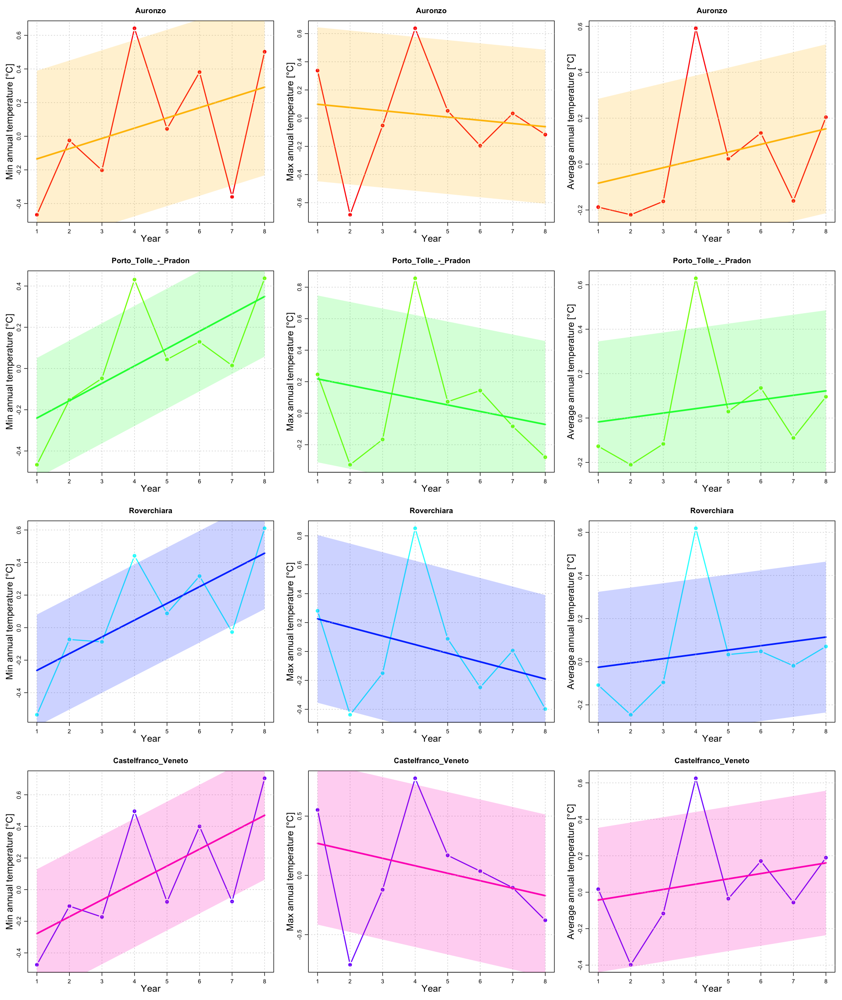

In [23]:
options(repr.plot.width=16, repr.plot.height=19)
par(mfrow = c(4,3), bg = "white", mar=c(4,4,3,1)) 
par(mgp = c(2, 0.8, 0))

# Color palette 
colors <- rainbow(length(stations_names)*2)

interval_length <- 4

for (i in 1:length(stations_names)) {
    for (measure in measures){
        name <- stations_names[[i]]
        annual_average <- dif_data[[name]][[measure]]
        coeffs <- linear_best_val[[name]][[measure]]

        if (measure == "min") {
          y_lab <- "Min"
        } else if (measure == "max") {
          y_lab <- "Max"
        } else if (measure == "avg") {
          y_lab <- "Average"
        }
        
        # Plot points
        plot(1:8, annual_average, type="b", pch=19, col=colors[2*i-1],
            lwd=2, cex.lab=1.6,
            main=name,
            font.main=2, cex.main=1.3,
            xlab="Year", ylab=paste(y_lab ,"annual temperature [°C]"))
        
        x_seg <- 1:8
        y_seg <- coeffs[['b']]*x_seg + coeffs[['a']]

        lines(x_seg, y_seg, col=colors[2*i], lwd=3)
        grid()

        y_upper <- y_seg + coeffs[['sigma']]
        y_lower <- y_seg - coeffs[['sigma']]
        polygon(c(x_seg, rev(x_seg)), c(y_upper, rev(y_lower)),
                col = do.call(rgb, as.list(c(col2rgb(colors[2*i]) / 255, 0.2))),
                border = NA)
     }
}


# Part 3
## Moving average
A moving average of order $m$ can be written as $$\hat T_k = \frac{1}{m}\sum_{i=-k}^ky_{t+j}$$ where $m = 2k+1$.

We analyse the evolution of the average temperature for the Castelfranco Veneto stations evaluating the moving averages with different values of $k$.

In [24]:
data_CV_avg <- ts(data = as.vector(t(dataset[["Castelfranco_Veneto"]][["Temperatura aria a 2m (_C) media delle medie"]])), start = c(1993,1), frequency = 12)
data_CV_avg

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
1993,4.1,3.3,10.3,11.2,17.2,20.9,24.6,24.2,18.6,12.3,9.0,3.4
1994,1.0,4.6,7.0,11.1,16.3,18.9,24.7,21.2,16.4,13.3,6.4,4.1
1995,3.9,2.3,6.0,12.6,17.3,21.5,21.0,21.0,15.5,12.3,8.2,2.7
1996,3.8,4.1,9.2,10.7,17.7,20.1,21.9,22.1,18.8,12.1,7.8,4.3
1997,3.2,5.1,7.3,11.6,17.9,21.5,23.6,23.7,17.7,12.2,4.9,0.7
1998,1.7,1.8,8.3,12.9,18.5,20.8,23.0,22.4,19.8,13.4,6.1,1.5
1999,-0.2,3.7,8.0,14.5,19.1,22.4,21.6,23.7,18.9,14.1,9.0,5.2
2000,4.4,4.9,10.0,11.7,19.9,20.3,23.2,24.0,16.0,15.8,6.4,0.1
2001,0.5,5.3,10.4,12.6,17.8,22.6,22.8,22.1,17.8,13.6,10.4,5.5
2002,2.6,1.9,8.8,12.0,20.3,25.3,24.9,27.0,17.9,11.6,9.4,4.5


Scale for x is already present.
Adding another scale for x, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


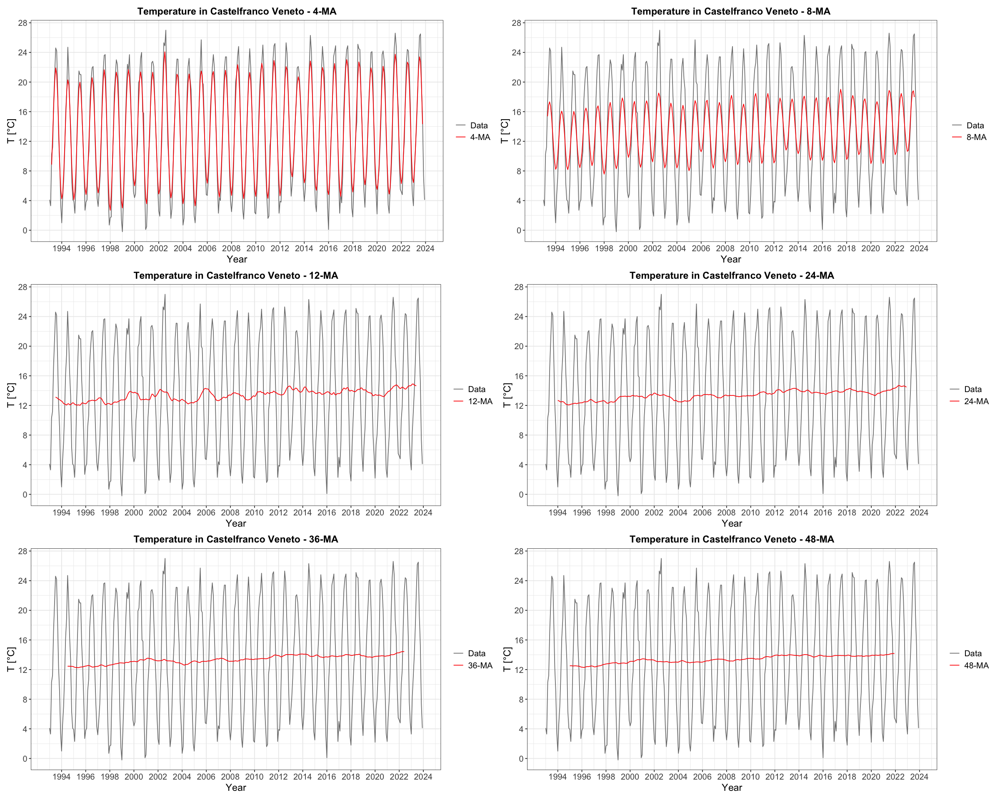

In [25]:
# choose your k values (in months)
k_values <- c(4, 8, 12, 24, 36, 48)

make_plot <- function(k) {
  ma_name <- paste0(k, "-MA")
  
    autoplot(data_CV_avg, series = "Data") +
      autolayer(ma(data_CV_avg, k), series = ma_name, na.rm = TRUE) +
      xlab("Year") +
      ylab("T [°C]") +
      ggtitle(paste("Temperature in Castelfranco Veneto -", ma_name)) +
      scale_colour_manual(
        values = setNames(c("grey50", "red"), c("Data", ma_name)),
        breaks = c("Data", ma_name)
      ) +
      scale_y_continuous(breaks = seq(0, 28, by = 4)) +
      scale_x_continuous(breaks = seq(1994, 2024, by = 2)) +
      theme_bw() +
      theme(
        text = element_text(size = 12),
        axis.text = element_text(size = 12),
        axis.title = element_text(size = 14),
        plot.title = element_text(size = 14, face = "bold", hjust = 0.5),
        legend.title = element_blank(),
        legend.text = element_text(size = 12),
        legend.position = "right",
        plot.margin = margin(5, 5, 5, 5)
      )
}

plots <- lapply(k_values, make_plot)

# Jupyter graphical window
options(repr.plot.width = 20, repr.plot.height = 16)

# Arrange in 2x2 grid
(plots[[1]] + plots[[2]]) / (plots[[3]] + plots[[4]]) / (plots[[5]] + plots[[6]])


## Time serie (classical) decomposition
We assume an addicive decomposition:  $y_t = S_t+T_t+R_t$\
$S_t$ is the *seasonal component*\
$T_t$ is the *trend component*\
$R_t$ is the *reminder component*

For the analysis we followed the passages contained in https://otexts.com/fpp2/classical-decomposition.html

In [26]:
# We use 12 months for the analysis
k <- 12

# ---------------------------------
# Compute T (trend component)
# -------------------------------------

if (k %% 2 == 0) {
  T_t <- ma(data_CV_avg, order = 2*k)
} else {
  T_t <- ma(data_CV_avg, order = k)
}

# -------------------------------
# Detrended series
# -------------------------------
detrended <- data_CV_avg - T_t

# ----------------------------------------
# Estimate S (seasonal component)
# ---------------------------------------

seasonal <- rep(NA, length(k))
periods <- cycle(data_CV_avg)

for (i in 1:k) {
  seasonal[i] <- mean(detrended[periods == i], na.rm = TRUE)
    
}

# adjusting seasonal component to sum to 0
seasonal <- seasonal - mean(seasonal)

# repeat seasonal pattern for all years
S_t <- rep(seasonal, length.out = length(data_CV_avg))

# -----------------------------------------
# Compute R (reminder component)
# ----------------------------------------
R_t <- data_CV_avg-T_t-S_t

decomp_df <- data.frame(
  Year = time(data_CV_avg),
  Original = as.numeric(data_CV_avg),
  Trend = as.numeric(T_t),
  Seasonal = S_t,
  Remainder = R_t
)

Warning message:
“Removed 24 rows containing missing values or values outside the scale range
(`geom_line()`).”
Warning message:
“Removed 24 rows containing missing values or values outside the scale range
(`geom_line()`).”


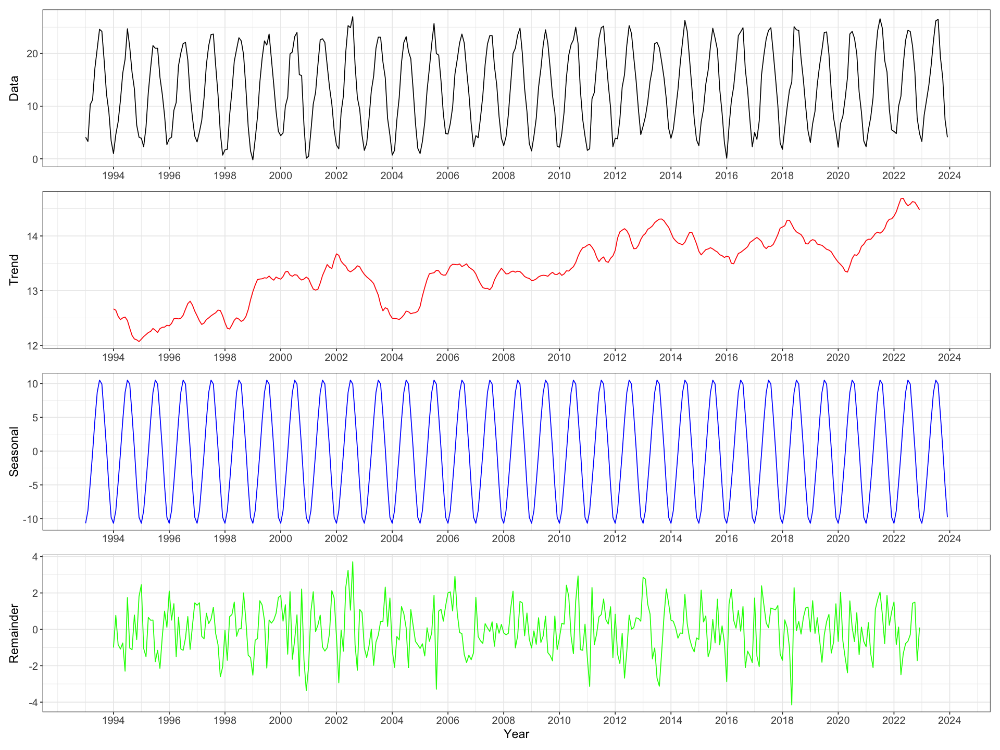

In [27]:
options(repr.plot.width = 16, repr.plot.height = 12)

decomp_df$Year <- as.numeric(decomp_df$Year)
decomp_df$Original <- as.numeric(decomp_df$Original)
decomp_df$Trend <- as.numeric(decomp_df$Trend)
decomp_df$Seasonal <- as.numeric(decomp_df$Seasonal)
decomp_df$Remainder <- as.numeric(decomp_df$Remainder)

p1 <- ggplot(decomp_df, aes(x = Year, y = Original)) +
  geom_line(color = "black") +
  ylab("Data") +
  theme_bw() +
  theme(
    axis.title.x = element_blank(),
    text = element_text(size = 14),
    axis.text = element_text(size = 12),
    plot.title = element_text(size = 16, face = "bold", hjust = 0.5)
  )+
    scale_x_continuous(breaks = seq(1994, 2024, by = 2))

p2 <- ggplot(decomp_df, aes(x = Year, y = Trend)) +
  geom_line(color = "red") +
  ylab("Trend") +
  theme_bw() +
  theme(
    axis.title.x = element_blank(),
    text = element_text(size = 14),
    axis.text = element_text(size = 12)
  )+
    scale_x_continuous(breaks = seq(1994, 2024, by = 2))

p3 <- ggplot(decomp_df, aes(x = Year, y = Seasonal)) +
  geom_line(color = "blue") +
  ylab("Seasonal") +
  theme_bw() +
  theme(
    axis.title.x = element_blank(),
    text = element_text(size = 14),
    axis.text = element_text(size = 12)
  )+
    scale_x_continuous(breaks = seq(1994, 2024, by = 2))

p4 <- ggplot(decomp_df, aes(x = Year, y = Remainder)) +
  geom_line(color = "green") +
  ylab("Remainder") +
  xlab("Year") +
  theme_bw() +
  theme(
    text = element_text(size = 14),
    axis.text = element_text(size = 12)
  )+
    scale_x_continuous(breaks = seq(1994, 2024, by = 2))

p1 / p2 / p3 / p4 + plot_layout(heights = c(1, 1, 1, 1))

Warning message:
“Removed 252 rows containing missing values or values outside the scale range
(`geom_line()`).”


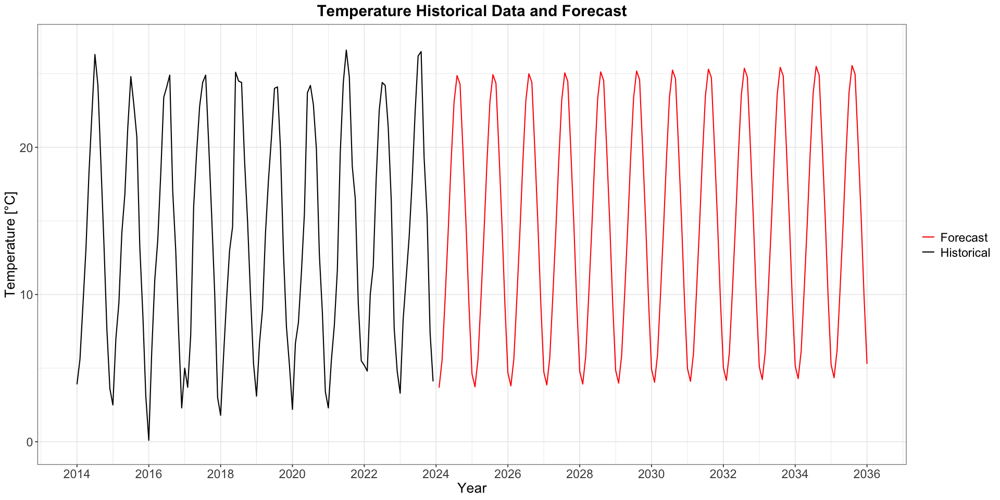

In [28]:
options(repr.plot.width = 16, repr.plot.height = 8)

freq <- k
n_future_years <- 12

# Forecast T using linear model
trend_series <- decomp_df$Trend
time_index <- 1:length(trend_series)
lm_trend <- lm(trend_series ~ time_index, na.action = na.exclude)

n_future <- freq * n_future_years
future_index <- (length(trend_series)+1):(length(trend_series)+n_future)
trend_forecast <- predict(lm_trend, newdata = data.frame(time_index = future_index))

# Repeat seasonal pattern
seasonal_pattern <- seasonal[1:freq]
seasonal_forecast <- rep(seasonal_pattern, length.out = n_future)

# Total forecast
forecast_values <- trend_forecast + seasonal_forecast

# Future time vector
last_year <- ceiling(max(decomp_df$Year))
future_time <- seq(last_year + 1/freq, last_year + n_future/freq, by = 1/freq)

forecast_df <- data.frame(
  Year = future_time,
  Forecast = forecast_values,
  Trend = trend_forecast,
  Seasonal = seasonal_forecast
)


ggplot() +
  geom_line(data = decomp_df, aes(x = Year, y = Original, color = "Historical"), linewidth = 0.6) +
  geom_line(data = forecast_df, aes(x = Year, y = Forecast, color = "Forecast"), linewidth = 0.6) +
  xlab("Year") + ylab("Temperature [°C]") +  
  scale_color_manual(values = c("Historical"="black", "Forecast"="red")) +
  ggtitle("Temperature Historical Data and Forecast") +
  theme_bw() +
  theme(
    text = element_text(size = 16),
    axis.text = element_text(size = 14),
    axis.title = element_text(size = 16),
    plot.title = element_text(size = 18, face = "bold", hjust = 0.5),
    legend.title = element_blank(),
    legend.text = element_text(size = 14),
    legend.position = "right"
  )+
scale_x_continuous(breaks = seq(1992, 2040, by = 2), limits = c(2014, 2036))
  

## ARIMA 

We apply a __Box-Cox transormation__ on a time-series to stabilize its variance through time:
$$
x_i(\lambda) =
\left\{ \begin{array}{rcl}
\frac{x_i^\lambda - 1}{\lambda}, & \lambda \neq 0 \\
\ln(x_i), & \lambda = 0.
\end{array}\right. 
$$
If $\lambda \approx 1$, variance is already constant in time and Box-Cox transformation is just a shift + rescale. 

[1] "Lambda: 1.00236086495126"


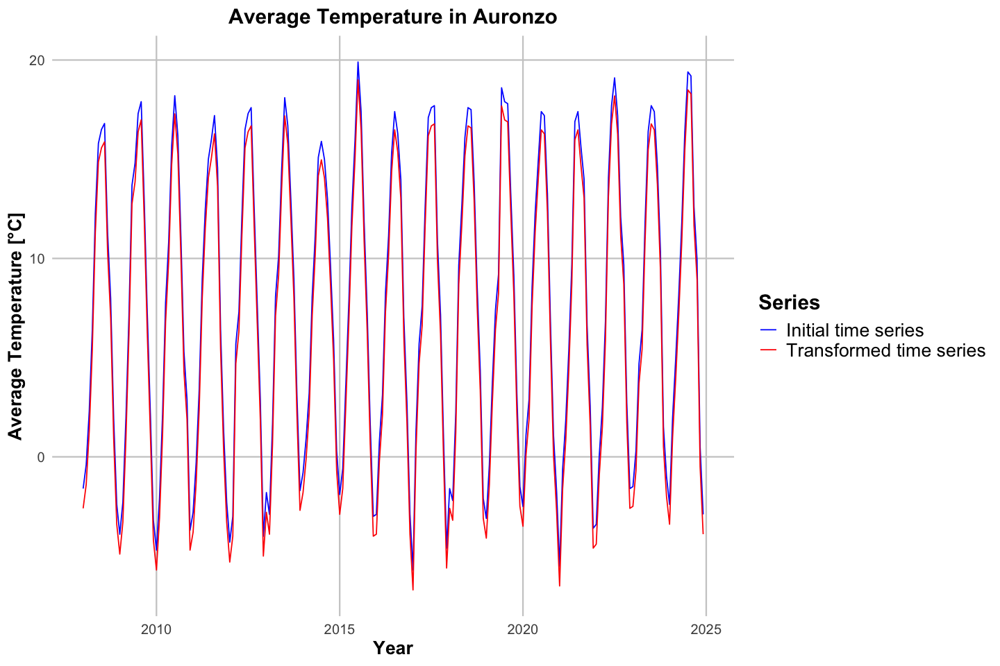

In [10]:
data <- dataset[['Auronzo']][["Temperatura aria a 2m (_C) media delle medie"]]
flatten_data <- unlist(split(data, seq(nrow(data))))
time_series <- ts(flatten_data, start = c(1994, 1), frequency = 12)

lambda <- BoxCox.lambda(flatten_data + 10, lower = -3, upper = 4)
print(paste0("Lambda: ", lambda))
transformed_data <- BoxCox(time_series, lambda)
start <- c(2008, 1)

plot <- (
  autoplot(window(time_series, start = start), series = 'Initial time series') +
  autolayer(window(transformed_data, start = start), series = 'Transformed time series', na.rm = TRUE) +
  xlab("Year") + 
  ylab("Average Temperature [°C]") +
  ggtitle("Average Temperature in Auronzo") +
  scale_color_manual(
    name = 'Series',
    values = c("Transformed time series" = "red", "Initial time series" = "blue")
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(size = 18, face = "bold", hjust = 0.5),
    axis.title = element_text(size = 16, face = "bold"),
    axis.text = element_text(size = 12),
    legend.title = element_text(size = 18, face = "bold"),
    legend.text  = element_text(size = 16),
    panel.grid.major = element_line(color = "grey80"),
    panel.grid.minor = element_blank(),
    plot.background = element_rect(fill = "white", color = NA),
    panel.background = element_rect(fill = "white", color = NA)
  )
)
plot

A non-seasonal $ARIMA(p, d, q)$ model is defined through the equation
$$
(1 - \phi_1 B - \cdots - \phi_p B^p)(1-B)^d y_t = c + (1 + \theta_1 B + \cdots + \theta_q B^q)\varepsilon_t
$$
where: <br>
- $y_t$ are the time-series observations, <br>
- $B$ denotes the _back-shift operator_ (e.g. $By_t = y_{t-1}$), <br>
- $c$ is an offset, called _drift_, <br>
- $\varepsilon_t$ are the _error terms_ (i.e. a normal distributions with 0-mean and unitary variance). <br>


A seasonal $ARIMA(p, d, q)(P, D, Q)_m$ model is obtained from a non-seasonal (p, d, q) equation after multiplying <br>
- on the LHS by $ (1 - \Phi_1 B^{m} - \cdots - \Phi_P B^{mP})(1-B^m)^D $, <br>
- on the RHS by $ (1 + \Theta_1 B^m + \cdots + \Theta_Q B^{mQ} ) $.

The best choice of $p, d, q, P, D, Q$ is the one that makes the ACF plot exponentially decaying or sinusoidal and it is performed automatically by R.

The estimation of $\phi_i, \theta_i, \Phi_i, \Theta_i$ is performed by Maximum Likelihood Estimation.

Warning message in guerrero(x, lower, upper):
“Guerrero's method for selecting a Box-Cox parameter (lambda) is given for strictly positive data.”



	Ljung-Box test

data:  Residuals from ARIMA(1,0,1)(0,1,2)[12]
Q* = 20.231, df = 20, p-value = 0.4436

Model df: 4.   Total lags used: 24



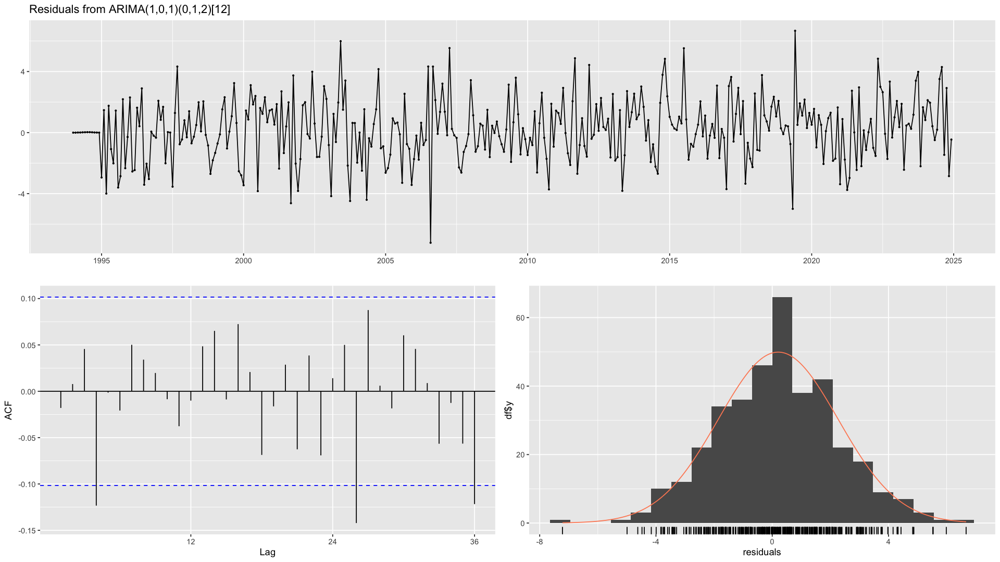

In [11]:
options(repr.plot.width = 16, repr.plot.height = 9)
best_model <- auto.arima(time_series, seasonal = TRUE, lambda = 'auto', stepwise = FALSE, approximation = FALSE)
checkresiduals(best_model, plot = TRUE)

In [12]:
summary(best_model)

Series: time_series 
ARIMA(1,0,1)(0,1,2)[12] 
Box Cox transformation: lambda= 1.248926 

Coefficients:
         ar1      ma1     sma1    sma2
      0.6056  -0.4630  -0.9543  0.0599
s.e.  0.2074   0.2283   0.0553  0.0530

sigma^2 = 4.485:  log likelihood = -788.98
AIC=1587.95   AICc=1588.12   BIC=1607.38

Training set error measures:
                    ME     RMSE      MAE  MPE MAPE      MASE       ACF1
Training set 0.1228718 1.312231 1.032735 -Inf  Inf 0.6844342 0.01834402

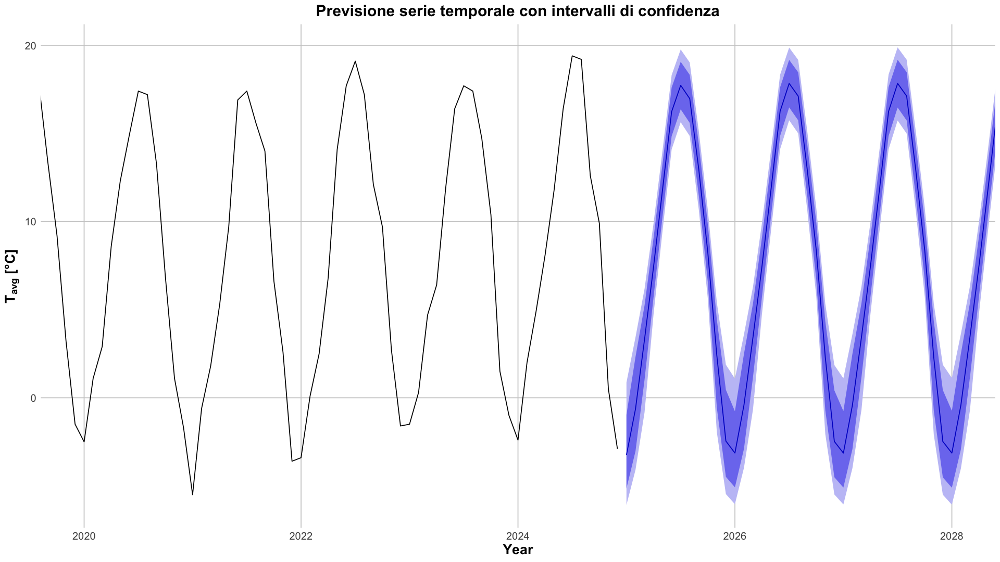

In [32]:
options(repr.plot.width = 16, repr.plot.height = 9)
my_forecast <- forecast(best_model, h = 12*5) 

autoplot(my_forecast, show.legend = TRUE) +
  coord_cartesian(xlim = c(2020, 2028)) +
  labs(
    title = "Previsione serie temporale con intervalli di confidenza",
    x = "Year",
    y = expression(bold(paste(T[avg], " [°C]"))),
    fill = "Intervalli di\nconfidenza"   
  ) +
  guides(fill = guide_legend(title = "Intervalli di\nconfidenza")) +
  theme_minimal() +
  theme(
    plot.title = element_text(size = 18, face = "bold", hjust = 0.5),
    axis.title = element_text(size = 16, face = "bold"),
    axis.text = element_text(size = 12),
    legend.title = element_text(size = 18, face = "bold"),
    legend.text  = element_text(size = 16),
    panel.grid.major = element_line(color = "grey80"),
    panel.grid.minor = element_blank(),
    plot.background = element_rect(fill = "white", color = NA),
    panel.background = element_rect(fill = "white", color = NA)
  )